# Predicción de Automoviles - AutoTech 

### PRE-ESPECIALIDAD:  

#### Ingeniería en ciencias de datos. 
#### ESTUDIANTES:  
* Escobar Chávez, Daniel Enrique   25-5351-2018   
* Espinoza Fuentes, José Mauricio  25-4443-2004   
* Jiménez Rivas, Giovanny Alfredo  25-5208-2018   
* Rodríguez Ruano, Evelyn Vanessa  25-1676-2019   
* Zepeda Romero, José Antonio      25-4916-2018   



 

### Objetivo:
#### Analizar las Caracteristicas de los precios de los automóviles y desarrollar un modelo predictivo.

### Problema: 
#### Nuestro objetivo principal es entender qué caracteristicas influyen en los precios de los automóviles. 
#### Además, queremos construir un modelo predictivo que nos permita predecir con precisión los precios de los automóviles utilizando datos/variables relevantes mediante la caracteristicas.

### Descripción del problema:
#### Nos proponemos investigar los impulsores detrás de las fluctuaciones de precios en el mercado automotriz. 
#### Con este fin, nuestro objetivo principal es analizar y comprender los factores que impactan directamente en los precios de los automóviles. 
#### Para lograr una comprensión más profunda y práctica, aspiramos a desarrollar un modelo predictivo capaz de proyectar los precios de los automóviles en función de los datos recopilados y las variables consideradas relevantes en nuestro análisis.


In [1]:
#Librerias A utilizar
import os
import numpy as np 
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, explained_variance_score, mean_absolute_error, mean_squared_error
from math import sqrt

%matplotlib inline

# Para cambiar los números científicos a formato float
np.set_printoptions(formatter={'float_kind':'{:f}'.format})

# Aumenta el tamaño de sns plots
sns.set(rc={'figure.figsize':(5,5)})

# ver todo el dataframe
pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

# eliminar los warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


# Cargando los Datos sin Procesar

In [2]:
# cargando la data
#raw_data = pd.read_csv('CarPrice_Assignment_v3N.csv')
#raw_data = pd.read_excel('CarPrice_Assignment_v3N.xlsx')
raw_data = pd.read_excel('CarPrice_Assignment_DS1.xlsx')

# print the shape
print(raw_data.shape)

#runs the first 5 rows
raw_data.head()


(750, 26)


,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,Honda-Amaze 1.2 VX i-VTEC - 206,gasolina,turbo,four,sedan,fwd,front,97.3,399.0,168.0,150.5,25284.00,ohc,four,1198,idi,3.62,3.5,9.3,109,4500,28,33,6060.0
1,2,3,Maruti Suzuki-Swift DZire VDI - 207,diesel,std,four,sedan,fwd,front,94.5,399.5,169.5,155.5,26357.25,ohcv,four,1248,mpfi,3.62,3.5,9.3,190,2000,19,24,5400.0
2,3,1,Toyota-Glanza G - 208,gasolina,std,four,hatchback,fwd,front,94.5,399.5,174.5,151.0,26349.50,ohcv,four,1197,mpfi,3.62,3.5,9.3,113,4200,25,25,9588.0
3,4,2,Toyota-Innova 2.4 VX 7 STR [2016-2020] - 209,diesel,turbo,four,Wagon,rwd,front,100.4,473.5,183.0,179.5,32848.50,ohcv,four,2393,mpfi,3.62,3.5,9.3,343,1400,19,24,23400.0
4,5,2,Maruti Suzuki-Ciaz ZXi - 210,gasolina,std,four,sedan,fwd,front,100.4,449.0,173.0,148.5,25690.50,ohcv,four,1373,mpfi,3.62,3.5,9.3,130,4000,28,33,8100.0


# Procesamiento de Datos

##  Análisis Exploratorio de Datos (EDA)

In [3]:
# Investigar todos los elementos dentro de cada característica. 

for column in raw_data:
    unique_vals = np.unique(raw_data[column])
    nr_values = len(unique_vals)
    if nr_values < 10:
        print('El número de valores para la característica {} :{} -- {}'.format(column, nr_values,unique_vals))
    else:
        print('El número de valores para la característica {} :{}'.format(column, nr_values))

El número de valores para la característica car_ID :750
El número de valores para la característica symboling :6 -- [-2 -1  0  1  2  3]
El número de valores para la característica CarName :750
El número de valores para la característica fueltype :2 -- ['diesel' 'gasolina']
El número de valores para la característica aspiration :2 -- ['std' 'turbo']
El número de valores para la característica doornumber :1 -- ['four']
El número de valores para la característica carbody :7 -- ['Convertible' 'Coupe' 'SUV' 'Van' 'Wagon' 'hatchback' 'sedan']
El número de valores para la característica drivewheel :3 -- ['awd' 'fwd' 'rwd']
El número de valores para la característica enginelocation :1 -- ['front']
El número de valores para la característica wheelbase :5 -- [94.500000 97.300000 100.400000 104.300000 109.100000]
El número de valores para la característica carlength :159
El número de valores para la característica carwidth :122
El número de valores para la característica carheight :144
El número 

## Chequiando valores NULL


In [4]:
## 5.2. Chequiando para  NULL Values
raw_data.isnull().sum()



car_ID              0
symboling           0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
dtype: int64

## Observaciones
* Eliminar observaciones con datos faltantes: Si las observaciones con datos faltantes son pocas y no representativas, puedes eliminarlas. Sin embargo, esto puede reducir la precisión del modelo.
* Reemplazar el valor faltante:
* Con la media o mediana: Para datos numéricos, puedes usar la media o mediana de la columna.
* Valor del día anterior o siguiente: En series temporales, usa el valor del día adyacente.
* Moda: Para variables categóricas, reemplaza con el valor más común.
* Cero: En ciertos casos, especialmente para cantidades no negativas.
* Imputación avanzada: Técnicas como la imputación múltiple pueden ser útiles en situaciones complejas.

In [5]:
# creaciones manuales de null values
raw_data['price 2'] = raw_data['price']
raw_data['price 2'].iloc[0] = np.nan
raw_data['price 2'].iloc[1] = np.nan
raw_data['price 2'].iloc[2] = np.nan

# cargando con el  the mean
raw_data['price 2'][raw_data['price 2'].isna()] = raw_data['price 2'].mean()

raw_data.head(10)

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\4130961333.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_data['price 2'].iloc[0] = np.nan
C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\4130961333.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_data['price 2'].iloc[1] = np.nan
C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\4130961333.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_data['price 2'].iloc[2

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price,price 2
0,1,3,Honda-Amaze 1.2 VX i-VTEC - 206,gasolina,turbo,four,sedan,fwd,front,97.3,399.0,168.0,150.5,25284.00,ohc,four,1198,idi,3.62,3.50,9.3,109,4500,28,33,6060.000,24306.874924
1,2,3,Maruti Suzuki-Swift DZire VDI - 207,diesel,std,four,sedan,fwd,front,94.5,399.5,169.5,155.5,26357.25,ohcv,four,1248,mpfi,3.62,3.50,9.3,190,2000,19,24,5400.000,24306.874924
2,3,1,Toyota-Glanza G - 208,gasolina,std,four,hatchback,fwd,front,94.5,399.5,174.5,151.0,26349.50,ohcv,four,1197,mpfi,3.62,3.50,9.3,113,4200,25,25,9588.000,24306.874924
3,4,2,Toyota-Innova 2.4 VX 7 STR [2016-2020] - 209,diesel,turbo,four,Wagon,rwd,front,100.4,473.5,183.0,179.5,32848.50,ohcv,four,2393,mpfi,3.62,3.50,9.3,343,1400,19,24,23400.000,23400.000000
4,5,2,Maruti Suzuki-Ciaz ZXi - 210,gasolina,std,four,sedan,fwd,front,100.4,449.0,173.0,148.5,25690.50,ohcv,four,1373,mpfi,3.62,3.50,9.3,130,4000,28,33,8100.000,8100.000000
5,6,2,Mercedes-Benz-CLA 200 Petrol Sport - 211,gasolina,std,four,sedan,fwd,front,100.4,463.0,177.7,143.2,25446.64,ohcv,four,1991,mpfi,3.62,3.50,9.3,300,1200,19,24,22787.988,22787.988000
6,7,1,BMW-X1 xDrive20d M Sport - 212,diesel,std,four,SUV,awd,front,104.3,443.9,182.1,161.2,29354.52,ohcv,four,1995,mpfi,3.31,3.54,8.7,400,1750,25,25,31800.000,31800.000000
7,8,1,Skoda-Octavia 1.8 TSI Style Plus AT [2017] - 213,gasolina,std,four,sedan,fwd,front,104.3,467.0,181.4,147.6,26774.64,l,four,1798,mpfi,3.27,3.35,22.5,250,1250,19,24,16680.000,16680.000000
8,9,1,Nissan-Terrano XL (D) - 214,diesel,std,four,SUV,fwd,front,104.3,433.1,182.2,167.1,30445.62,l,four,1461,mpfi,3.31,3.54,8.7,200,1900,28,33,6900.000,6900.000000
9,10,0,Hyundai-Elite i20 Sportz 1.2 - 215,gasolina,std,four,hatchback,fwd,front,104.3,398.5,173.4,150.5,26096.70,l,four,1197,mpfi,3.31,3.54,8.7,115,4000,18,24,7092.000,7092.000000


In [6]:
# creacion manual de null values
raw_data['price 2'] = raw_data['price']
raw_data['price 2'].iloc[0] = np.nan
raw_data['price 2'].iloc[1] = np.nan
raw_data['price 2'].iloc[2] = np.nan

# cargando con el mean
raw_data['price 2'][raw_data['price 2'].isna()] = raw_data['price 2'].mean()

# borrando la columna Price 2 
del raw_data['price 2']

raw_data.head()

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\3502023650.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_data['price 2'].iloc[0] = np.nan
C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\3502023650.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_data['price 2'].iloc[1] = np.nan
C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\3502023650.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_data['price 2'].iloc[2

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,Honda-Amaze 1.2 VX i-VTEC - 206,gasolina,turbo,four,sedan,fwd,front,97.3,399.0,168.0,150.5,25284.00,ohc,four,1198,idi,3.62,3.5,9.3,109,4500,28,33,6060.0
1,2,3,Maruti Suzuki-Swift DZire VDI - 207,diesel,std,four,sedan,fwd,front,94.5,399.5,169.5,155.5,26357.25,ohcv,four,1248,mpfi,3.62,3.5,9.3,190,2000,19,24,5400.0
2,3,1,Toyota-Glanza G - 208,gasolina,std,four,hatchback,fwd,front,94.5,399.5,174.5,151.0,26349.50,ohcv,four,1197,mpfi,3.62,3.5,9.3,113,4200,25,25,9588.0
3,4,2,Toyota-Innova 2.4 VX 7 STR [2016-2020] - 209,diesel,turbo,four,Wagon,rwd,front,100.4,473.5,183.0,179.5,32848.50,ohcv,four,2393,mpfi,3.62,3.5,9.3,343,1400,19,24,23400.0
4,5,2,Maruti Suzuki-Ciaz ZXi - 210,gasolina,std,four,sedan,fwd,front,100.4,449.0,173.0,148.5,25690.50,ohcv,four,1373,mpfi,3.62,3.5,9.3,130,4000,28,33,8100.0


# Investigando los valores numéricos con gráficos de dispersión


C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


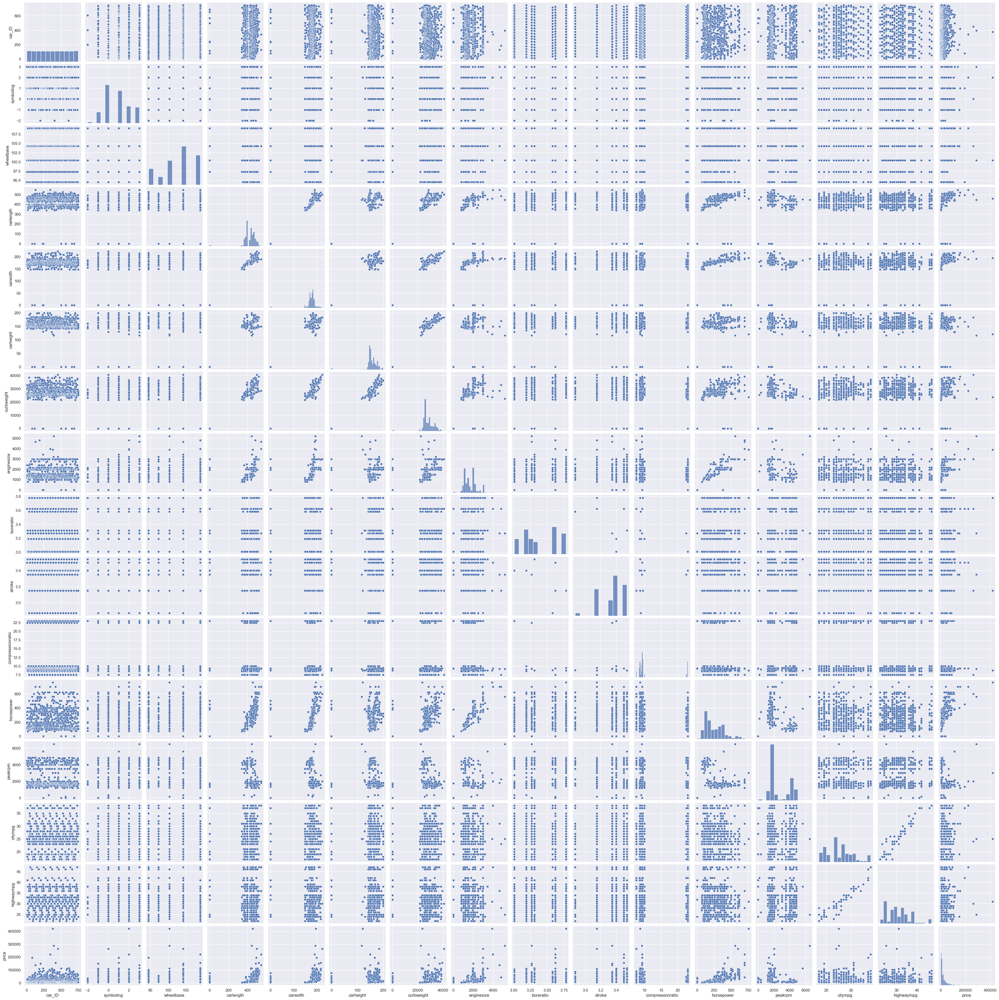

In [7]:
# Ejemplo 1 - Visualizar los datos utilizando Pairplots de seaborn.

g = sns.pairplot(raw_data)



C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


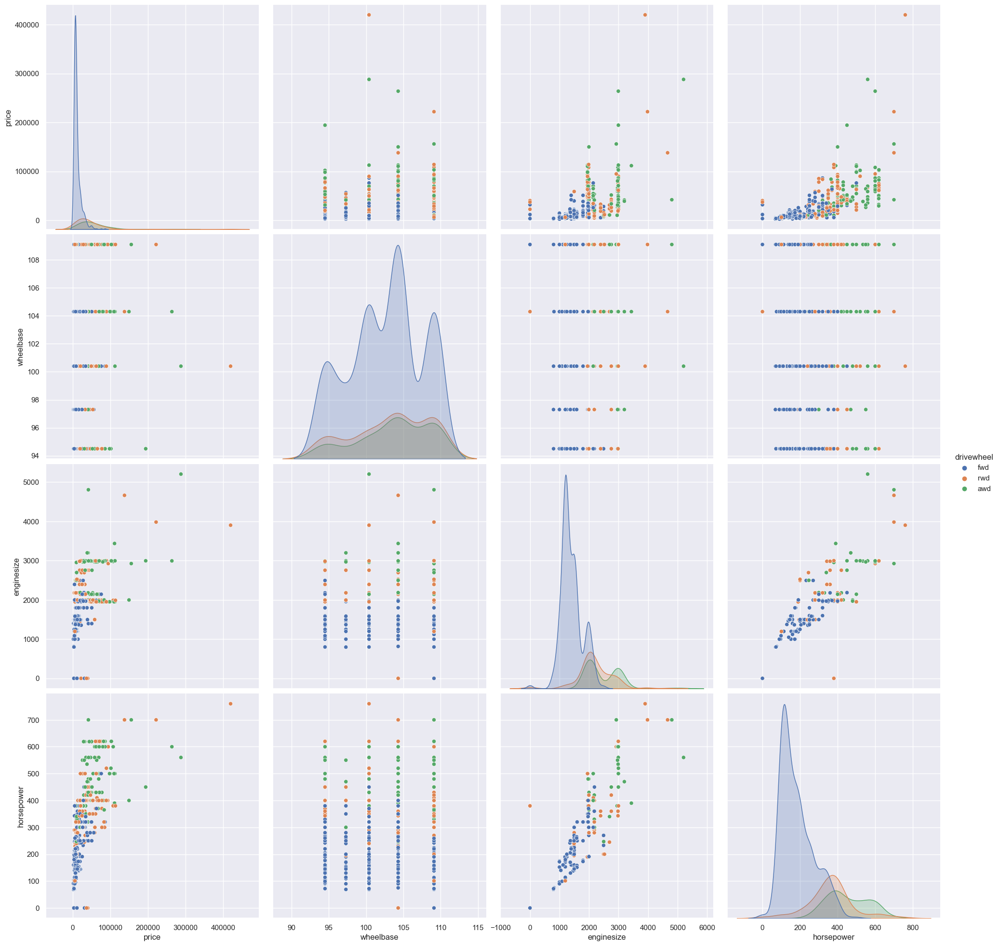

In [8]:
# Ejemplo 2 - Visualizando un subconjunto de nuestros datos: características importantes
g = sns.pairplot(raw_data[['price', 'wheelbase', 'enginesize','horsepower','drivewheel']], hue = 'drivewheel', height = 5)

C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


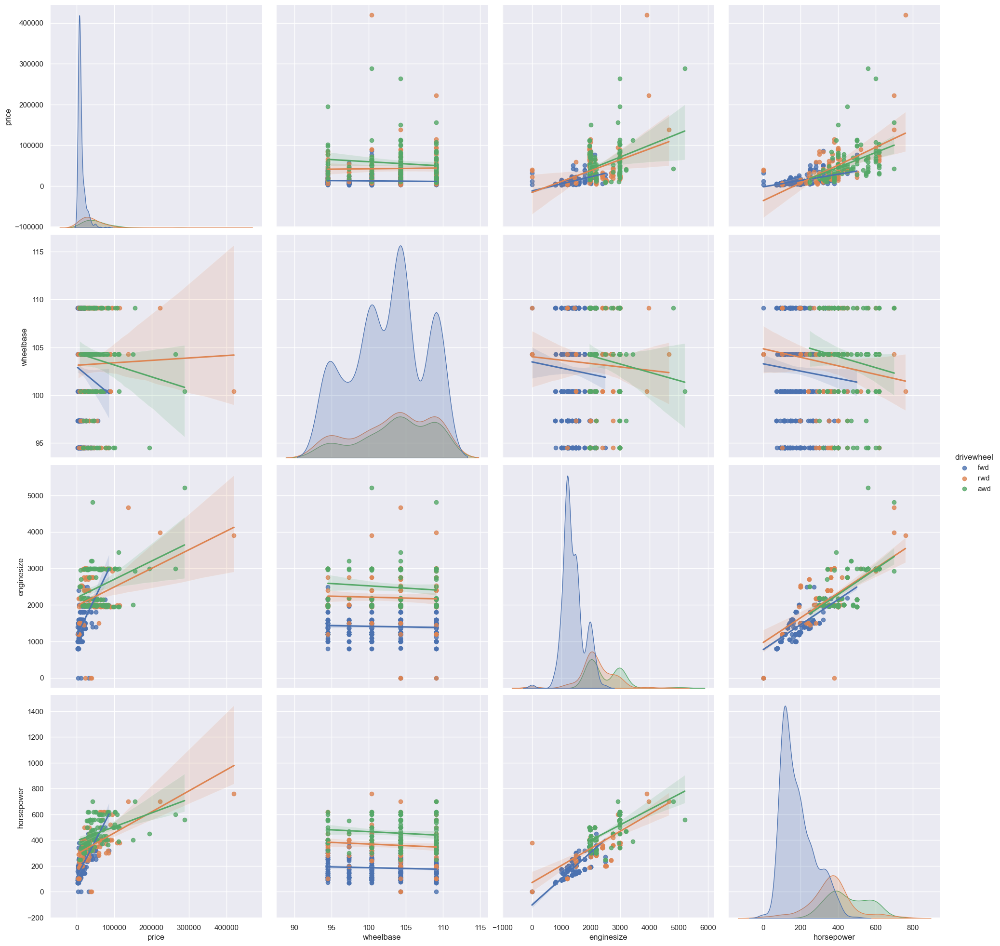

In [9]:
# Ejemplo 3 - Visualizando un subconjunto de nuestros datos: características importantes

g = sns.pairplot(raw_data[['price', 'wheelbase', 'enginesize','horsepower','drivewheel']], hue = 'drivewheel', height = 5, kind="reg")

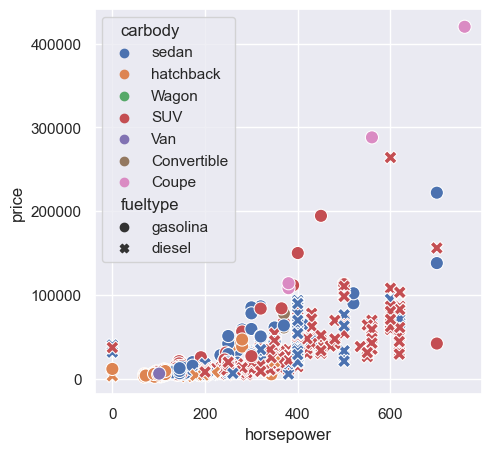

In [10]:
#Ejemplo 4 - Relación entre el precio y la potencia en caballos de fuerza por tipo de carrocería
ax = sns.scatterplot(x="horsepower", y="price", data=raw_data, hue = 'carbody', style = 'fueltype', s=90)

# Indagando en los datos categóricos.

,carbody,price
0,Convertible,69600.000000
1,Coupe,195600.000000
2,SUV,29831.561726
3,Van,7649.997000
4,Wagon,18860.000000
5,hatchback,7270.081608
6,sedan,26990.253239


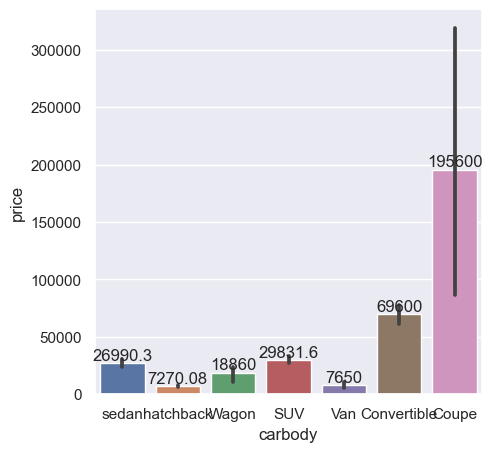

In [11]:
# Ejemplo 5 - Precio promedio por tipo de carrocería

ax = sns.barplot(x="carbody", y="price", data=raw_data)
ax.bar_label(ax.containers[0])

# Notas: 
#Las líneas muestran el rango de certeza.
# Utiliza el promedio como punto de referencia predeterminado.

raw_data[['carbody', 'price']].groupby('carbody', as_index = False).agg({'price':'mean'})

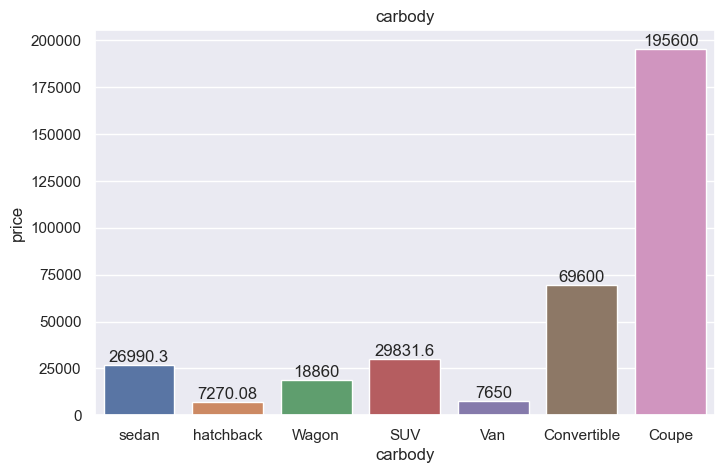

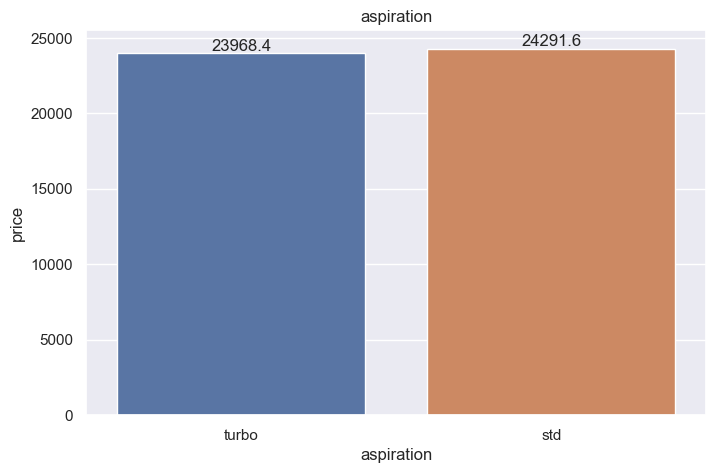

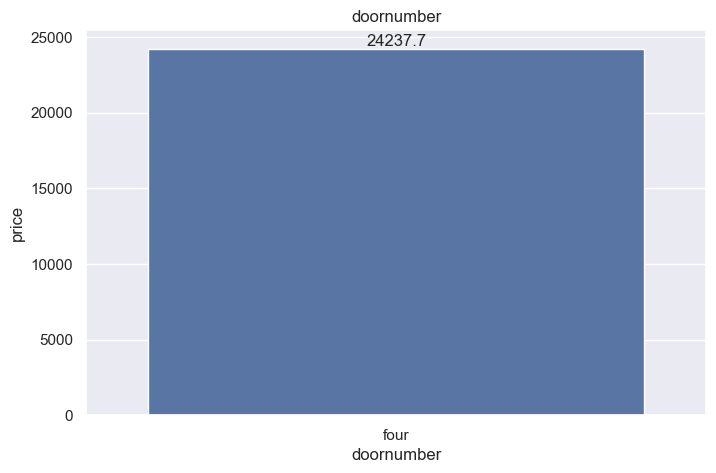

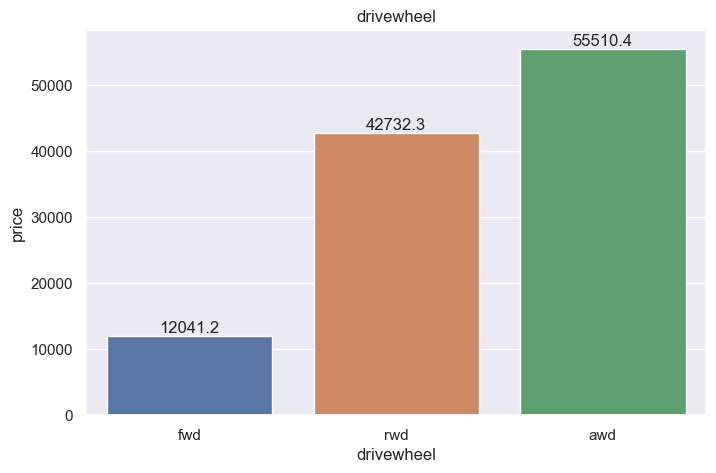

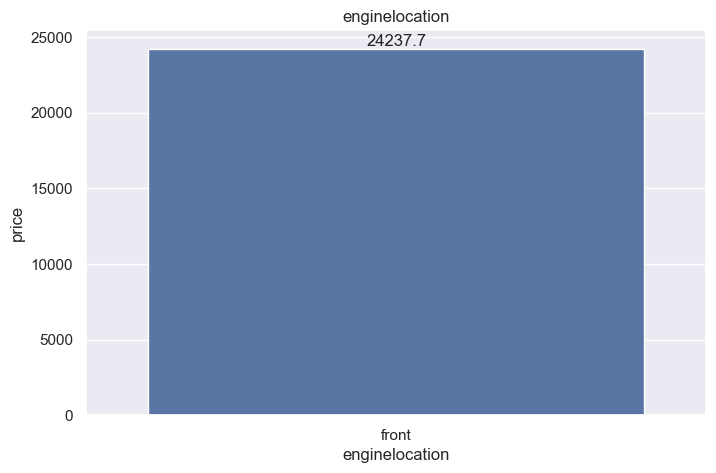

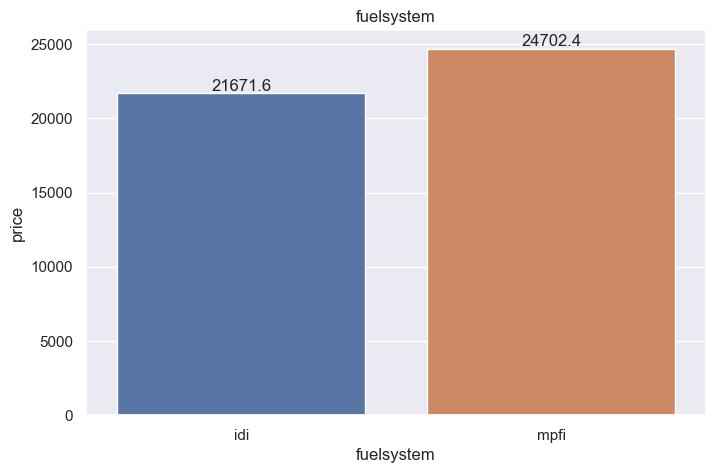

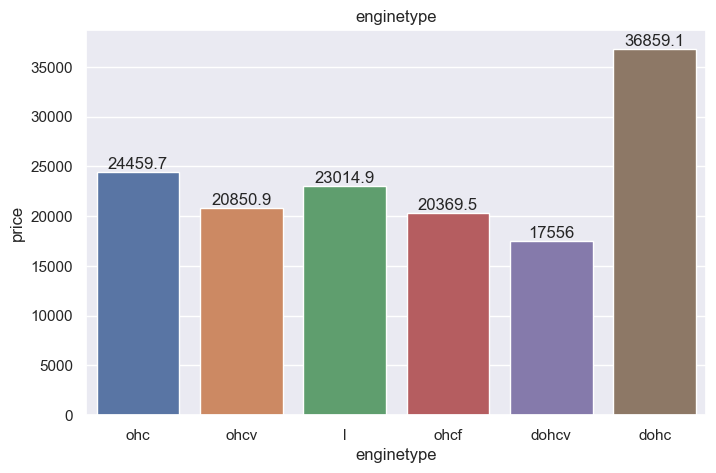

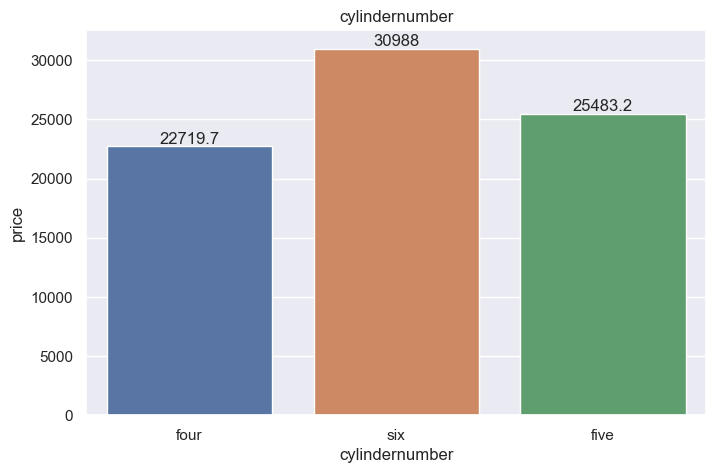

In [12]:
# Ejemplo 6 - Precio total por tipo de carrocería para múltiples categorías

categories = ['carbody', 'aspiration','doornumber','drivewheel','enginelocation', 'fuelsystem', 'enginetype','cylindernumber']

# Aumenta el tamaño de los gráficos de sns
sns.set(rc={'figure.figsize':(8,5)})

for c in categories:
    
    ax = sns.barplot(x=c, y="price", data=raw_data, ci=False) #, hue = 'fueltype')
    for container in ax.containers:
        ax.bar_label(container)
    plt.title(c)
    plt.show()

# Indagando en las distribuciones con gráficos de distribución.

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1574371017.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


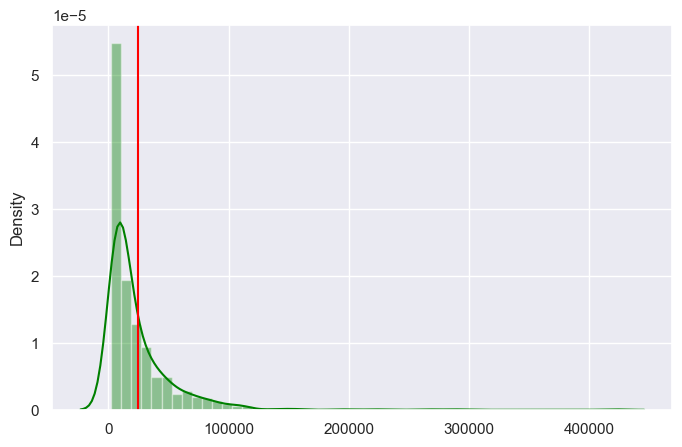

In [13]:
# Ejemplo 7 - Investigando la distribución del precio, añadiendo la media

x = raw_data['price'].values

sns.distplot(x, color = 'green');

# Calcular la media
mean = raw_data['price'].mean()

#Graficando
plt.axvline(mean, 0,1, color = 'red')

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


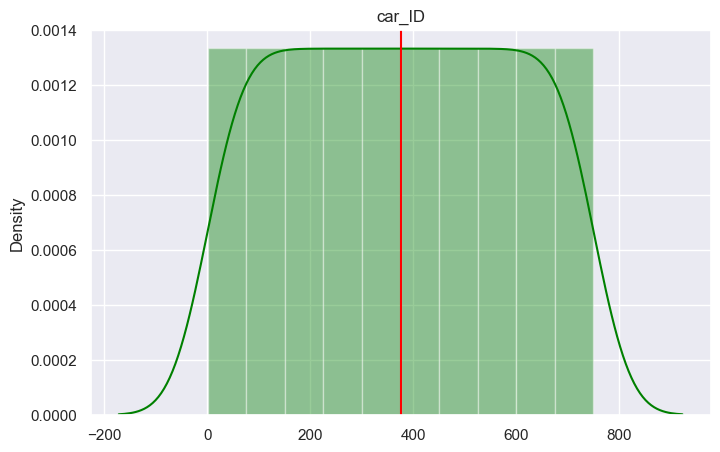

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


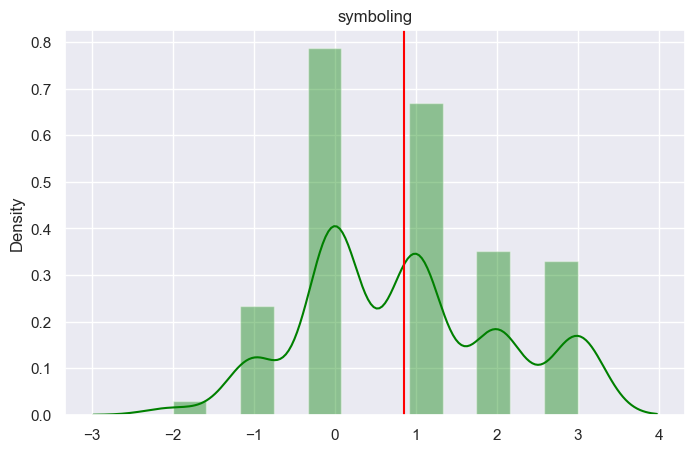

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


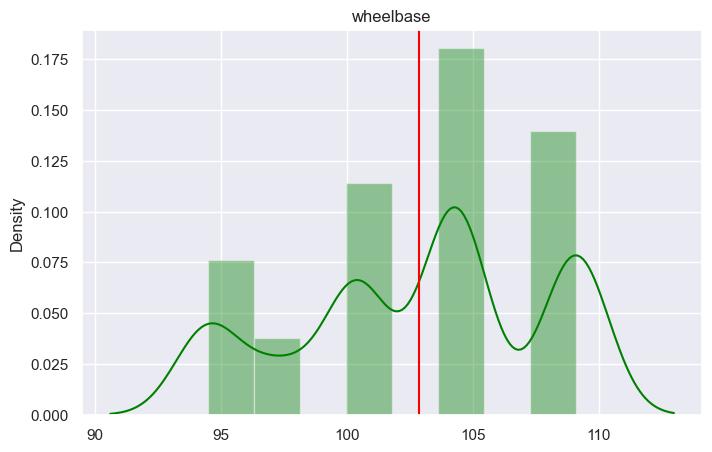

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


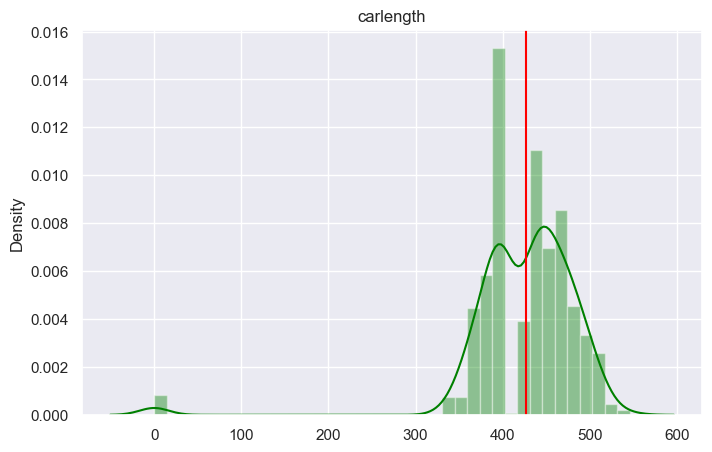

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


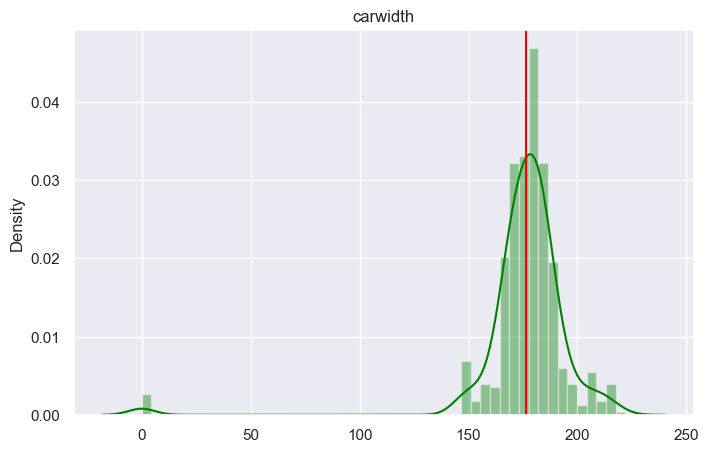

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


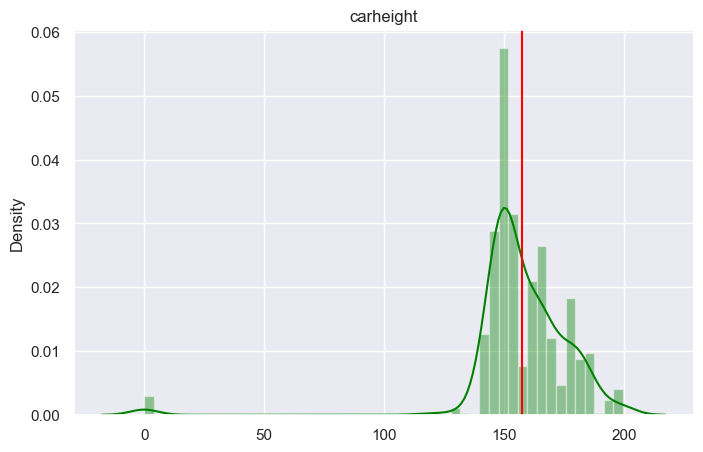

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


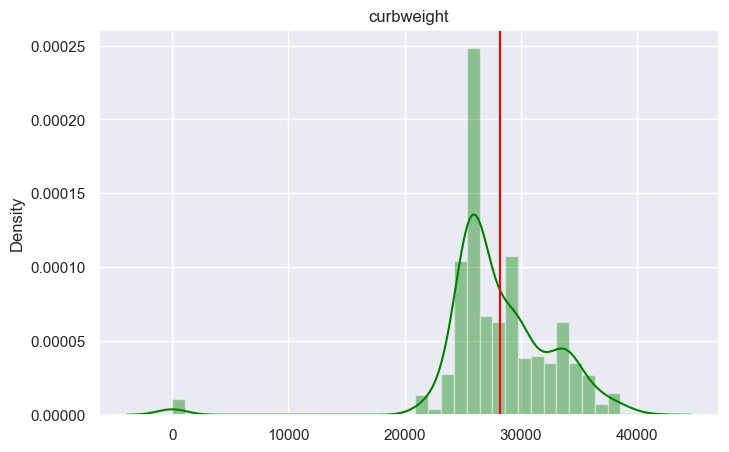

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


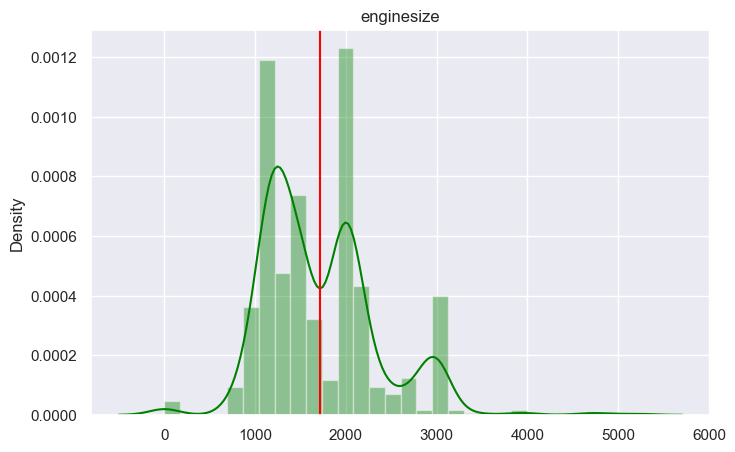

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


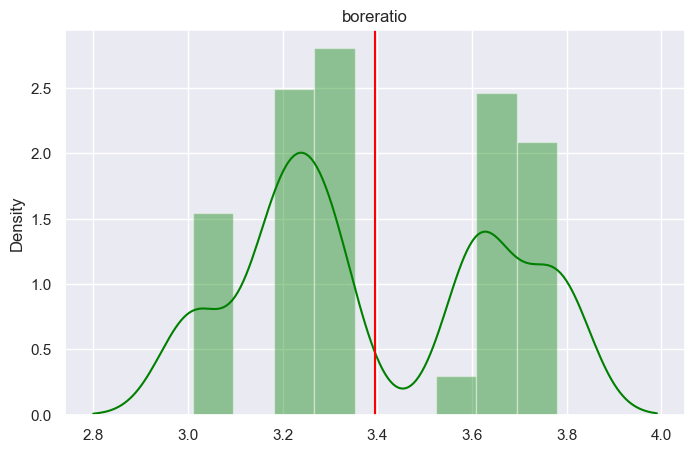

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


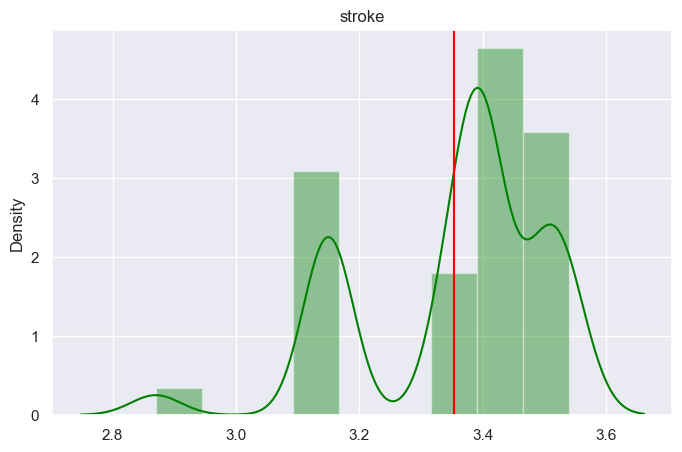

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


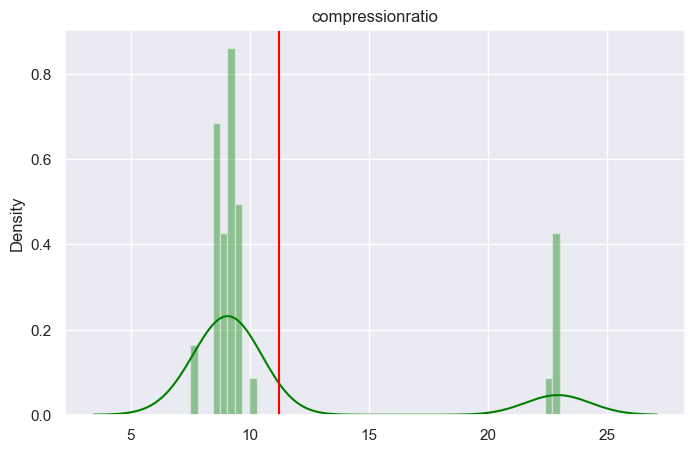

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


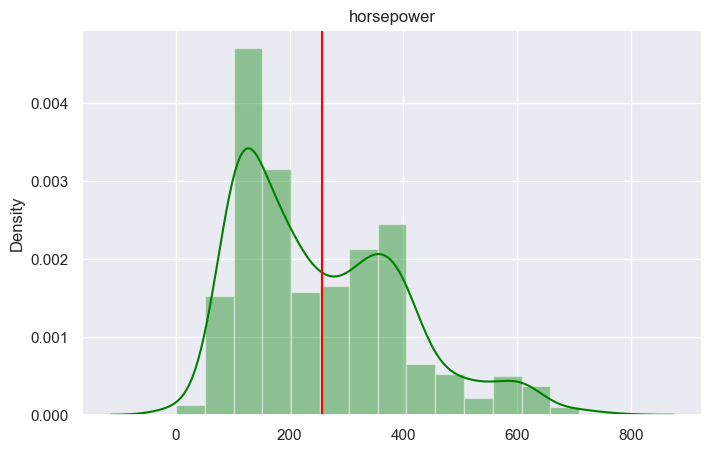

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


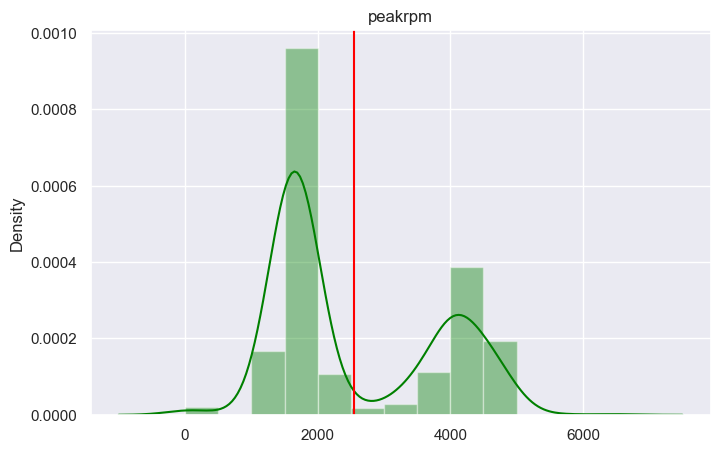

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


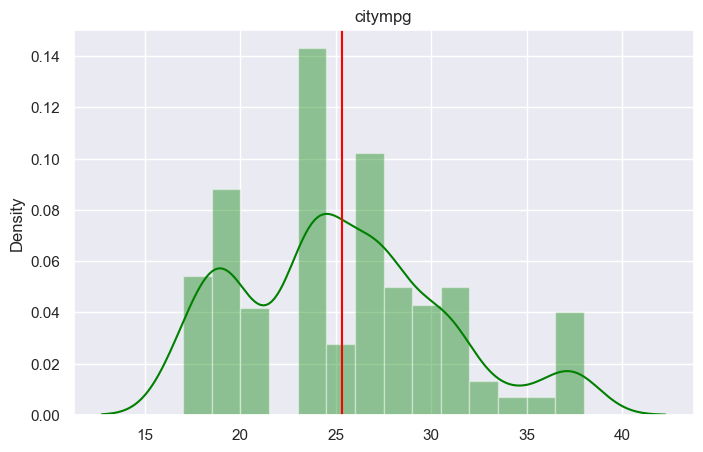

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


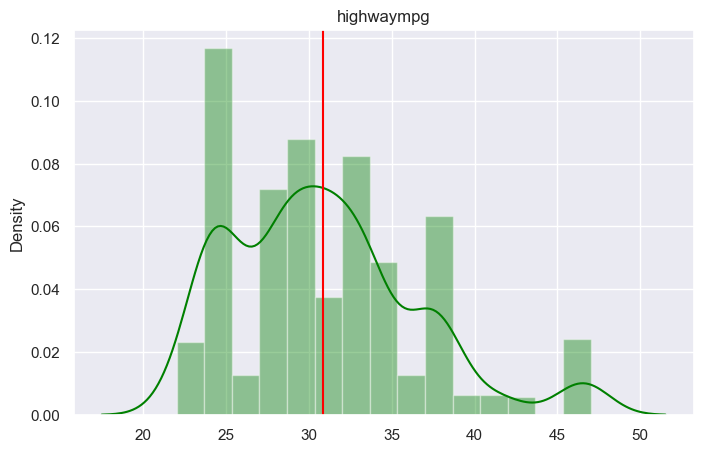

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1946812060.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x, color = 'green');


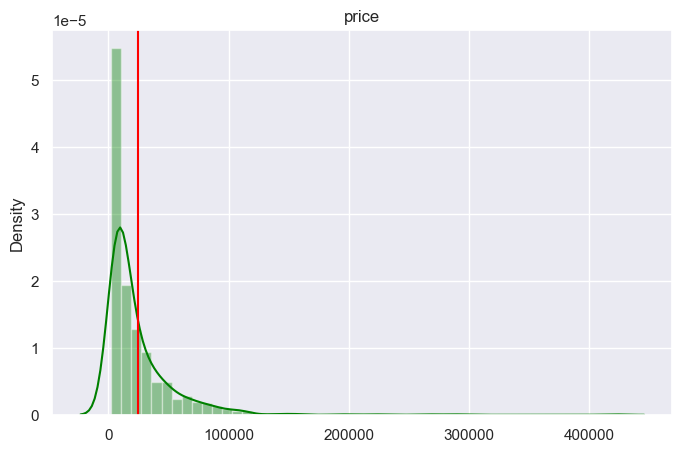

In [14]:
# Ejemplo 8 - Investigando la distribución de todos los campos, añadiendo la media

#Identificando todas las columnas numéricas
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
n_variables = raw_data.select_dtypes(include=numerics).columns

# Aumenta el tamaño de los gráficos de sns.
sns.set(rc={'figure.figsize':(8,5)})


for n in n_variables:
    x = raw_data[n].values
    sns.distplot(x, color = 'green');

    # Calcular Media
    mean = raw_data[n].mean()

    #Graficando
    plt.axvline(mean, 0,1, color = 'red')
    plt.title(n)
    plt.show()

In [15]:
n_variables

Index(['car_ID', 'symboling', 'wheelbase', 'carlength', 'carwidth',
       'carheight', 'curbweight', 'enginesize', 'boreratio', 'stroke',
       'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg',
       'price'],
      dtype='object')

# Indagando en la distribución y los valores atípicos con diagramas de Box plots .

The meadian is:  12360.0


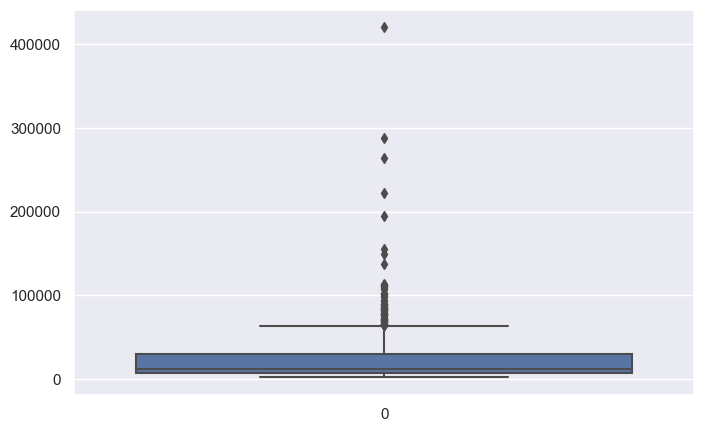

In [16]:
# Ejemplo 9 - Investigando la distribución del precio

x = raw_data['price'].values
ax = sns.boxplot(x)

print('The meadian is: ', raw_data['price'].median())

# Notes:
# La línea representa el valor central, es decir, la mediana.
#El rectángulo en el centro indica el comienzo del primer cuartil (25º percentil) y el final del tercer cuartil (75º percentil).
#Las líneas exteriores, de izquierda a derecha, muestran el cuartil mínimo y el cuartil máximo.
#Los puntos en el extremo derecho se refieren a "valores atípicos".

The meadian is:  375.5


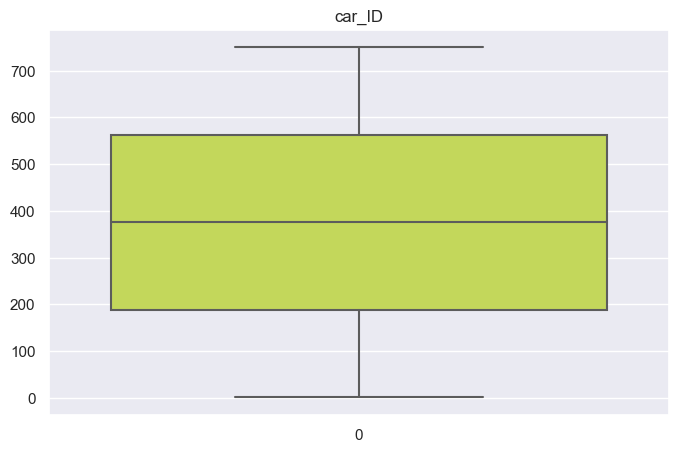

The meadian is:  1.0


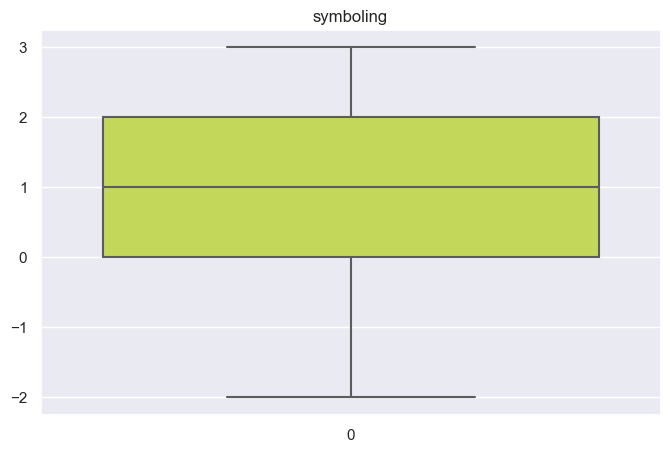

The meadian is:  104.3


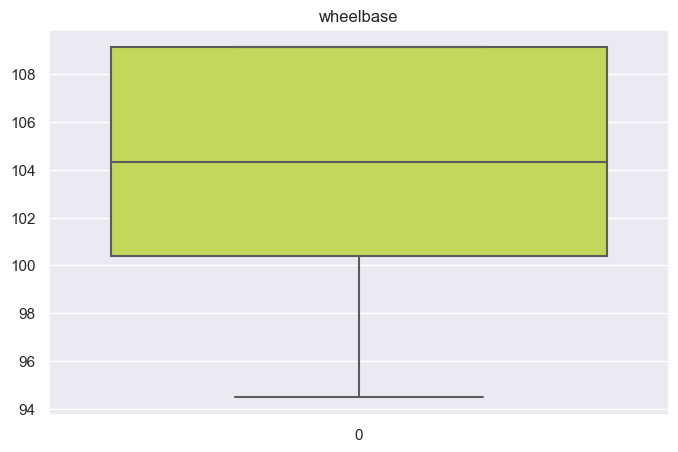

The meadian is:  437.0


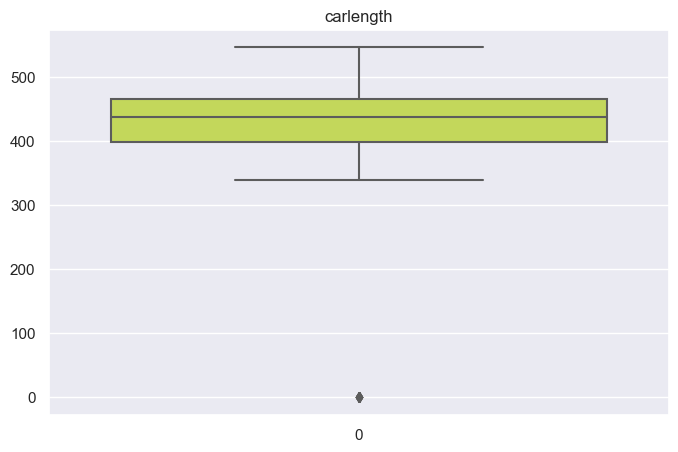

The meadian is:  178.0


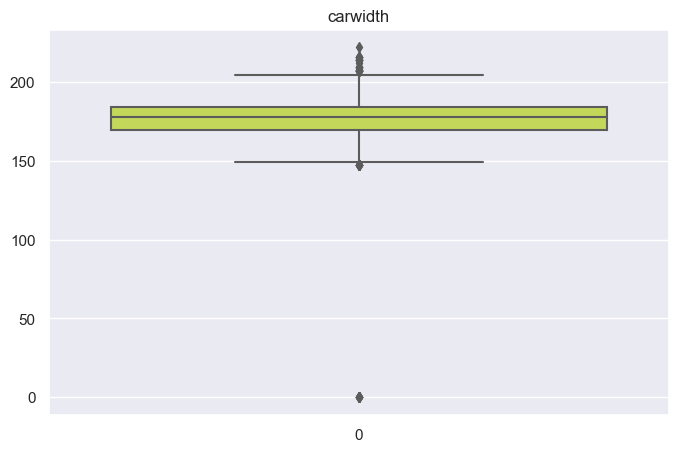

The meadian is:  154.25


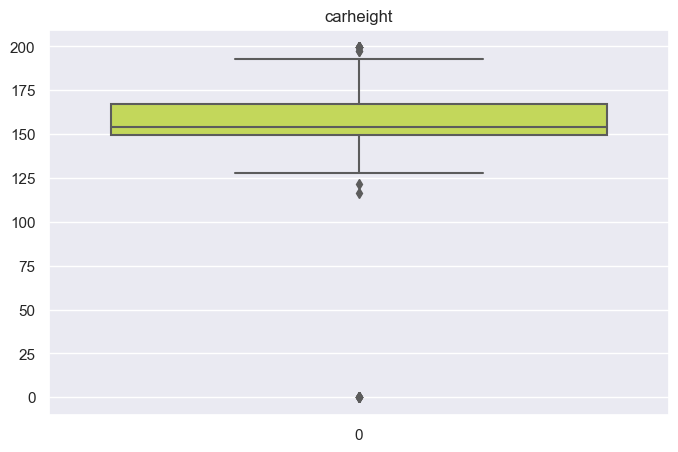

The meadian is:  27200.85


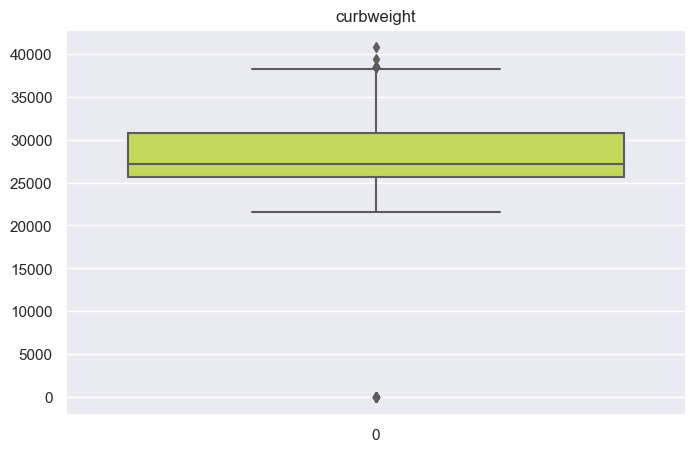

The meadian is:  1498.0


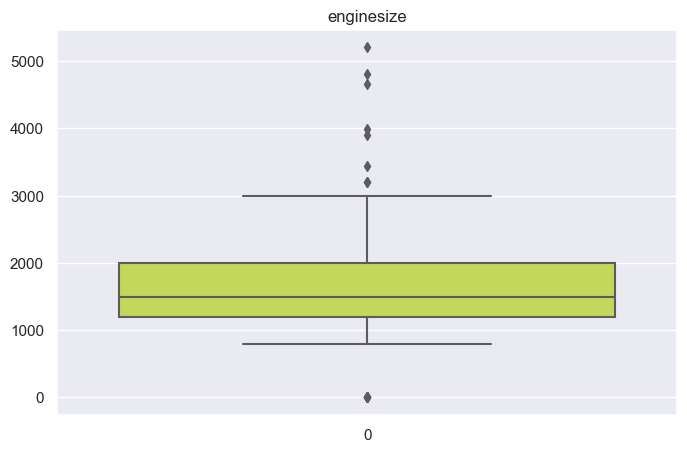

The meadian is:  3.31


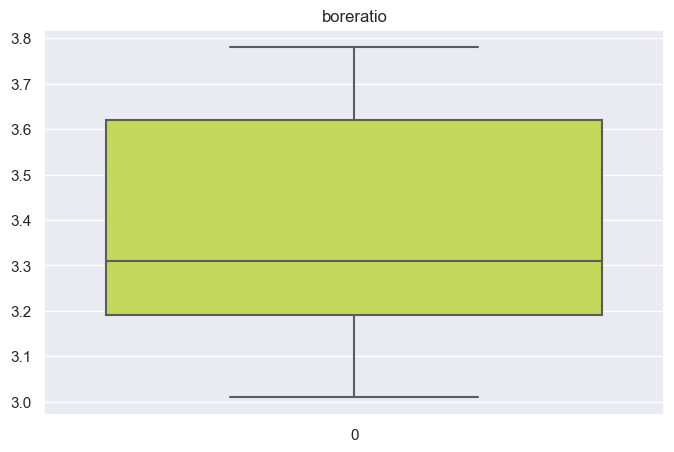

The meadian is:  3.4


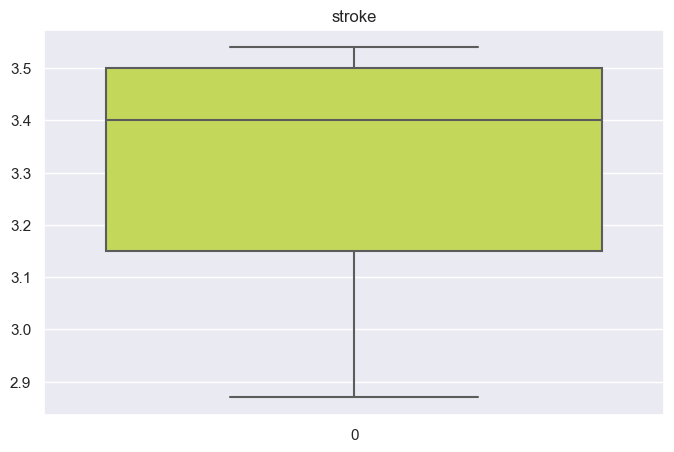

The meadian is:  9.3


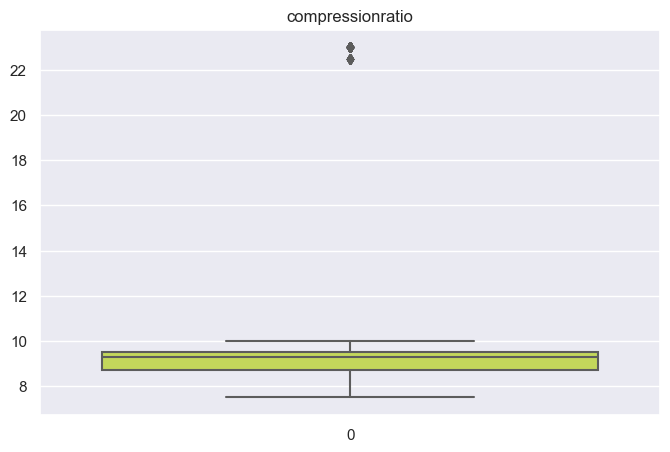

The meadian is:  220.0


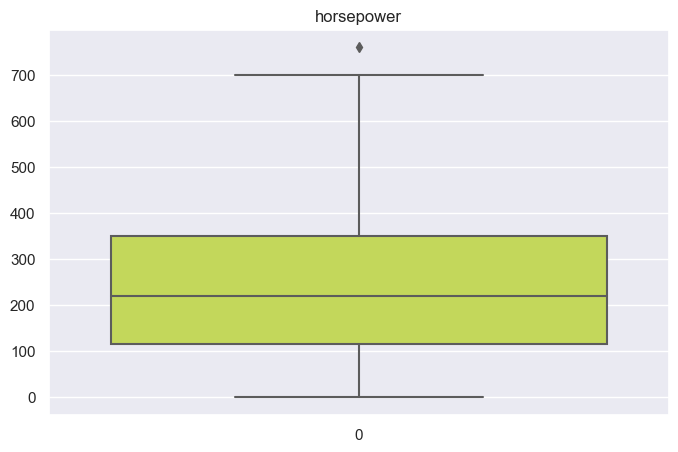

The meadian is:  1750.0


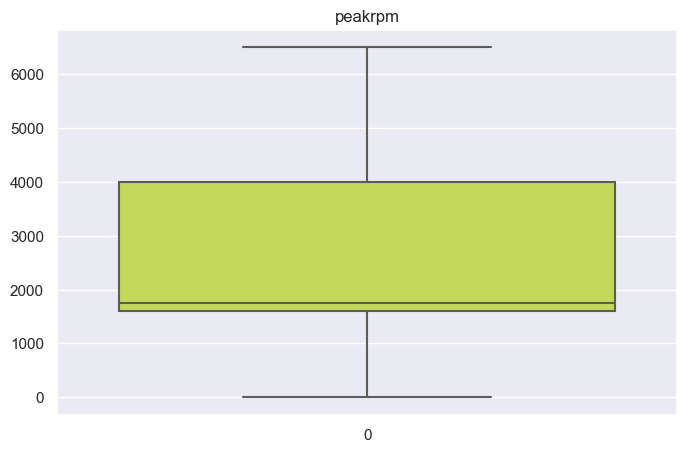

The meadian is:  25.0


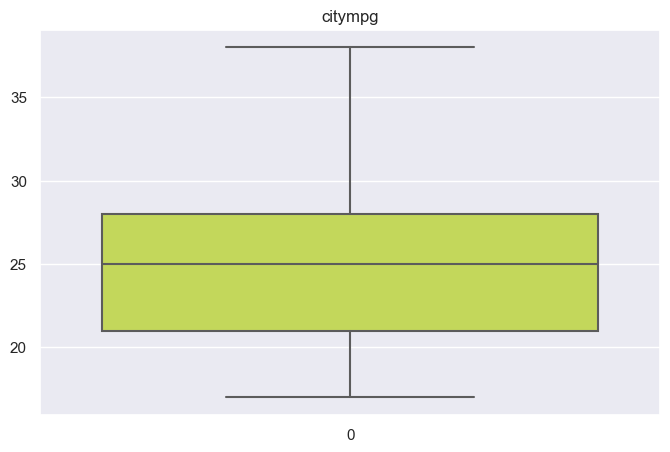

The meadian is:  30.0


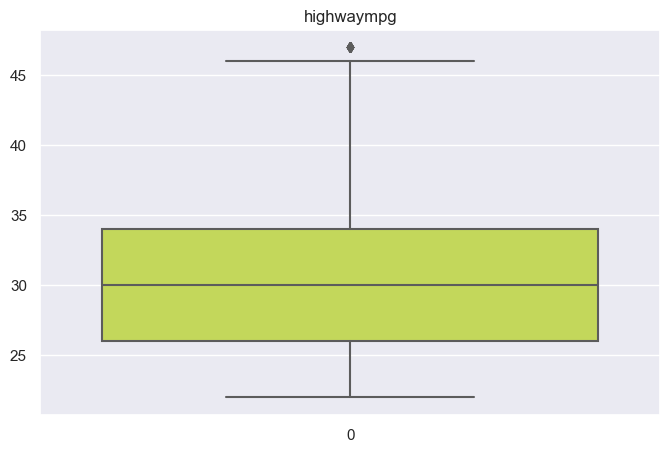

The meadian is:  12360.0


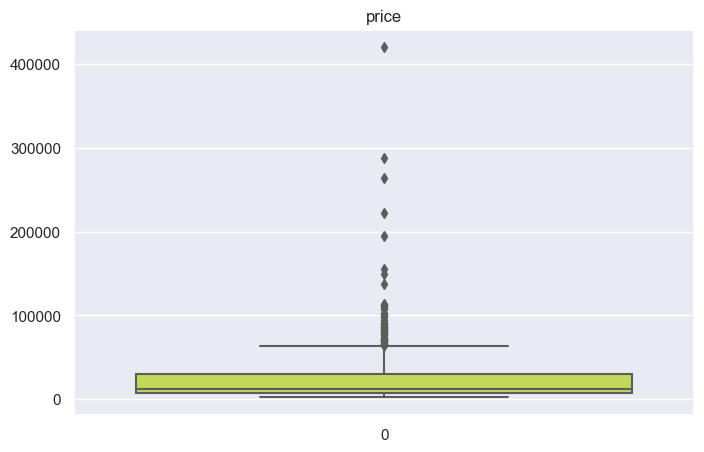

In [17]:
#Ejemplo 10 - Investigando la distribución de todos los valores numéricos
# Aumenta el tamaño de los gráficos de sns.
sns.set(rc={'figure.figsize':(8,5)})

for c in n_variables:    
    x = raw_data[c].values
    ax = sns.boxplot(x, color = '#D1EC46')
    print('The meadian is: ', raw_data[c].median())
    plt.title(c)
    plt.show()

C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 59.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 86.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 69.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


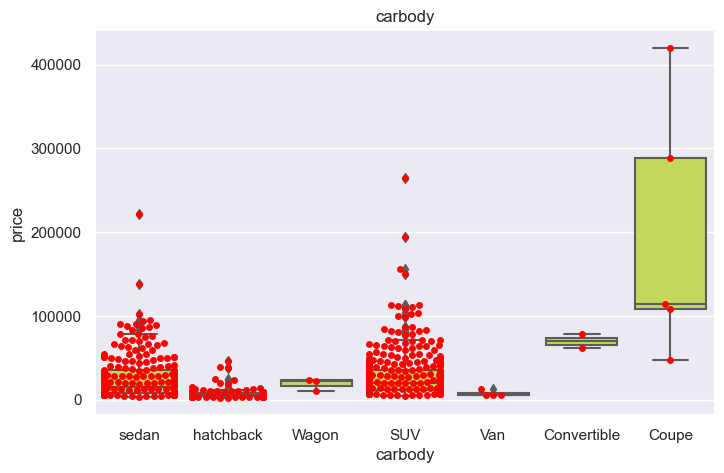

C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 17.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 56.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


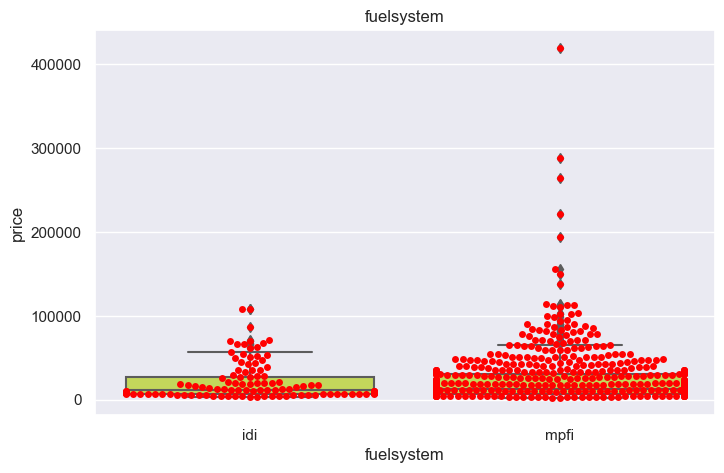

C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 71.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 30.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 37.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 51.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 5.4% of the points 

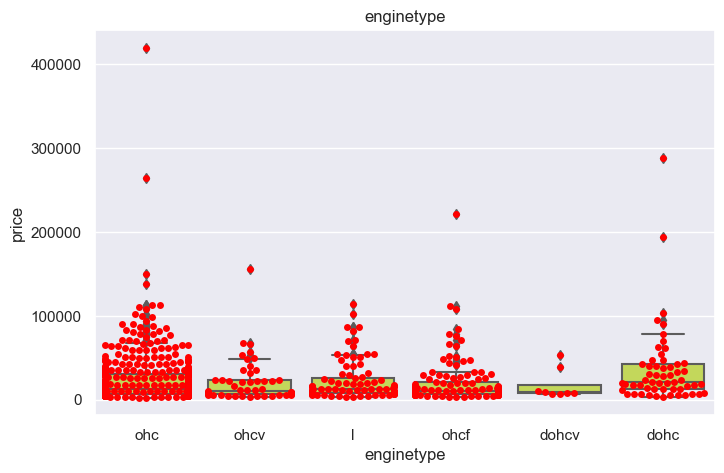

C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 65.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\jimen\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 23.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


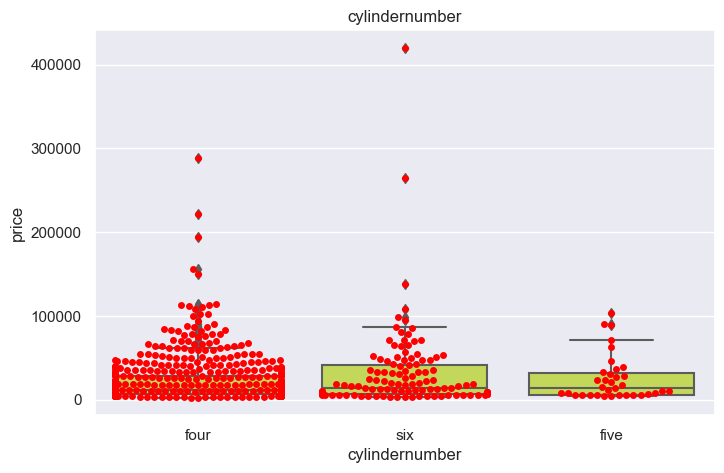

In [18]:
#Ejemplo 11 - Investigando la distribución del precio por variables categóricas - por puntos de datos

categories = ['carbody','fuelsystem', 'enginetype','cylindernumber']

# Aumenta el tamaño de los gráficos de sns.
sns.set(rc={'figure.figsize':(8,5)})

for c in categories:
    ax = sns.boxplot(x=c, y="price", data=raw_data, color = '#D1EC46')
    ax = sns.swarmplot(x=c, y="price", data=raw_data, color="red")
    plt.title(c)
    plt.show()


# Convertir los valores categóricos en representación numérica.

In [19]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [20]:
raw_data.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,Honda-Amaze 1.2 VX i-VTEC - 206,gasolina,turbo,four,sedan,fwd,front,97.3,399.0,168.0,150.5,25284.00,ohc,four,1198,idi,3.62,3.5,9.3,109,4500,28,33,6060.0
1,2,3,Maruti Suzuki-Swift DZire VDI - 207,diesel,std,four,sedan,fwd,front,94.5,399.5,169.5,155.5,26357.25,ohcv,four,1248,mpfi,3.62,3.5,9.3,190,2000,19,24,5400.0
2,3,1,Toyota-Glanza G - 208,gasolina,std,four,hatchback,fwd,front,94.5,399.5,174.5,151.0,26349.50,ohcv,four,1197,mpfi,3.62,3.5,9.3,113,4200,25,25,9588.0
3,4,2,Toyota-Innova 2.4 VX 7 STR [2016-2020] - 209,diesel,turbo,four,Wagon,rwd,front,100.4,473.5,183.0,179.5,32848.50,ohcv,four,2393,mpfi,3.62,3.5,9.3,343,1400,19,24,23400.0
4,5,2,Maruti Suzuki-Ciaz ZXi - 210,gasolina,std,four,sedan,fwd,front,100.4,449.0,173.0,148.5,25690.50,ohcv,four,1373,mpfi,3.62,3.5,9.3,130,4000,28,33,8100.0


In [21]:
# Convertir las variables categóricas en representación numérica.

new_raw_data = pd.get_dummies(raw_data, columns = ['carbody', 'aspiration','doornumber','drivewheel','enginelocation', 'fuelsystem', 'enginetype', 'fueltype'], dtype=int)
new_raw_data.head()

,car_ID,symboling,CarName,wheelbase,carlength,carwidth,carheight,curbweight,cylindernumber,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price,carbody_Convertible,carbody_Coupe,carbody_SUV,carbody_Van,carbody_Wagon,carbody_hatchback,carbody_sedan,aspiration_std,aspiration_turbo,doornumber_four,drivewheel_awd,drivewheel_fwd,drivewheel_rwd,enginelocation_front,fuelsystem_idi,fuelsystem_mpfi,enginetype_dohc,enginetype_dohcv,enginetype_l,enginetype_ohc,enginetype_ohcf,enginetype_ohcv,fueltype_diesel,fueltype_gasolina
0,1,3,Honda-Amaze 1.2 VX i-VTEC - 206,97.3,399.0,168.0,150.5,25284.00,four,1198,3.62,3.5,9.3,109,4500,28,33,6060.0,0,0,0,0,0,0,1,0,1,1,0,1,0,1,1,0,0,0,0,1,0,0,0,1
1,2,3,Maruti Suzuki-Swift DZire VDI - 207,94.5,399.5,169.5,155.5,26357.25,four,1248,3.62,3.5,9.3,190,2000,19,24,5400.0,0,0,0,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0,0,1,1,0
2,3,1,Toyota-Glanza G - 208,94.5,399.5,174.5,151.0,26349.50,four,1197,3.62,3.5,9.3,113,4200,25,25,9588.0,0,0,0,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,0,0,1,0,1
3,4,2,Toyota-Innova 2.4 VX 7 STR [2016-2020] - 209,100.4,473.5,183.0,179.5,32848.50,four,2393,3.62,3.5,9.3,343,1400,19,24,23400.0,0,0,0,0,1,0,0,0,1,1,0,0,1,1,0,1,0,0,0,0,0,1,1,0
4,5,2,Maruti Suzuki-Ciaz ZXi - 210,100.4,449.0,173.0,148.5,25690.50,four,1373,3.62,3.5,9.3,130,4000,28,33,8100.0,0,0,0,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0,0,1,0,1


In [22]:
#Convertir variables categóricas en representación numérica.

new_raw_data = pd.get_dummies(raw_data, columns = ['carbody', 'aspiration','doornumber','drivewheel','enginelocation', 'fuelsystem', 'enginetype', 'fueltype'])

new_raw_data['cylindernumber'].loc[new_raw_data['cylindernumber'] == 'two'] = 2
new_raw_data['cylindernumber'].loc[new_raw_data['cylindernumber'] == 'three'] = 3
new_raw_data['cylindernumber'].loc[new_raw_data['cylindernumber'] == 'four'] = 4
new_raw_data['cylindernumber'].loc[new_raw_data['cylindernumber'] == 'five'] = 5
new_raw_data['cylindernumber'].loc[new_raw_data['cylindernumber'] == 'six'] = 6
new_raw_data['cylindernumber'].loc[new_raw_data['cylindernumber'] == 'eight'] = 8
new_raw_data['cylindernumber'].loc[new_raw_data['cylindernumber'] == 'twelve'] = 12
new_raw_data['cylindernumber'] = new_raw_data['cylindernumber'].astype(int)

warnings.simplefilter(action='ignore', category=FutureWarning)

new_raw_data.dtypes

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1446254427.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_raw_data['cylindernumber'].loc[new_raw_data['cylindernumber'] == 'two'] = 2
C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1446254427.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_raw_data['cylindernumber'].loc[new_raw_data['cylindernumber'] == 'three'] = 3
C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\1446254427.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/sta

car_ID                    int64
symboling                 int64
CarName                  object
wheelbase               float64
carlength               float64
carwidth                float64
carheight               float64
curbweight              float64
cylindernumber            int32
enginesize                int64
boreratio               float64
stroke                  float64
compressionratio        float64
horsepower                int64
peakrpm                   int64
citympg                   int64
highwaympg                int64
price                   float64
carbody_Convertible        bool
carbody_Coupe              bool
carbody_SUV                bool
carbody_Van                bool
carbody_Wagon              bool
carbody_hatchback          bool
carbody_sedan              bool
aspiration_std             bool
aspiration_turbo           bool
doornumber_four            bool
drivewheel_awd             bool
drivewheel_fwd             bool
drivewheel_rwd             bool
enginelo

In [23]:
new_raw_data.head()

,car_ID,symboling,CarName,wheelbase,carlength,carwidth,carheight,curbweight,cylindernumber,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price,carbody_Convertible,carbody_Coupe,carbody_SUV,carbody_Van,carbody_Wagon,carbody_hatchback,carbody_sedan,aspiration_std,aspiration_turbo,doornumber_four,drivewheel_awd,drivewheel_fwd,drivewheel_rwd,enginelocation_front,fuelsystem_idi,fuelsystem_mpfi,enginetype_dohc,enginetype_dohcv,enginetype_l,enginetype_ohc,enginetype_ohcf,enginetype_ohcv,fueltype_diesel,fueltype_gasolina
0,1,3,Honda-Amaze 1.2 VX i-VTEC - 206,97.3,399.0,168.0,150.5,25284.00,4,1198,3.62,3.5,9.3,109,4500,28,33,6060.0,False,False,False,False,False,False,True,False,True,True,False,True,False,True,True,False,False,False,False,True,False,False,False,True
1,2,3,Maruti Suzuki-Swift DZire VDI - 207,94.5,399.5,169.5,155.5,26357.25,4,1248,3.62,3.5,9.3,190,2000,19,24,5400.0,False,False,False,False,False,False,True,True,False,True,False,True,False,True,False,True,False,False,False,False,False,True,True,False
2,3,1,Toyota-Glanza G - 208,94.5,399.5,174.5,151.0,26349.50,4,1197,3.62,3.5,9.3,113,4200,25,25,9588.0,False,False,False,False,False,True,False,True,False,True,False,True,False,True,False,True,False,False,False,False,False,True,False,True
3,4,2,Toyota-Innova 2.4 VX 7 STR [2016-2020] - 209,100.4,473.5,183.0,179.5,32848.50,4,2393,3.62,3.5,9.3,343,1400,19,24,23400.0,False,False,False,False,True,False,False,False,True,True,False,False,True,True,False,True,False,False,False,False,False,True,True,False
4,5,2,Maruti Suzuki-Ciaz ZXi - 210,100.4,449.0,173.0,148.5,25690.50,4,1373,3.62,3.5,9.3,130,4000,28,33,8100.0,False,False,False,False,False,False,True,True,False,True,False,True,False,True,False,True,False,False,False,False,False,True,False,True


# Seleccionando las características importantes.

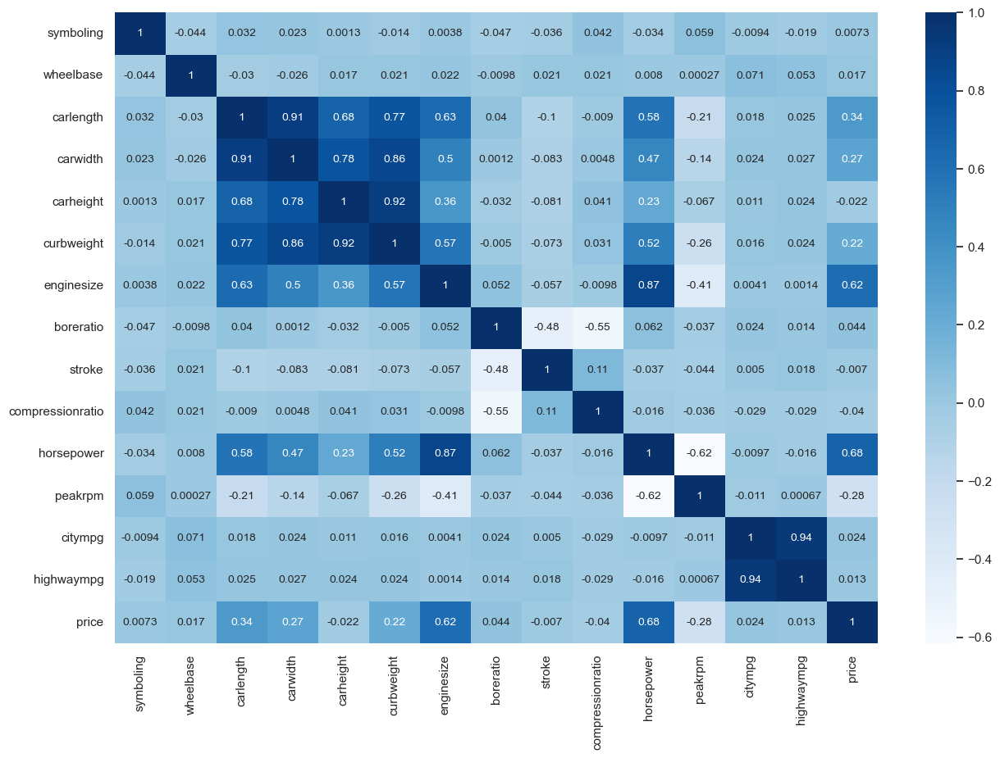

In [24]:
# Example 12 - Heatmap 

# Eliminando columnas que no necesitamos
#del new_raw_data['car_ID']
del new_raw_data['CarName']

# Aumenta el tamaño de los gráficos de sns.
sns.set(rc={'figure.figsize':(15,10)})

n_variables = ['symboling', 'wheelbase', 'carlength', 'carwidth', 'carheight',
       'curbweight', 'enginesize', 'boreratio', 'stroke', 'compressionratio',
       'horsepower', 'peakrpm', 'citympg', 'highwaympg', 'price']

pc = new_raw_data[n_variables].corr(method ='pearson')

cols = n_variables

ax = sns.heatmap(pc, annot=True,
                 yticklabels=cols,
                 xticklabels=cols,
                 annot_kws={'size':10},
                 cmap="Blues")

In [25]:
new_raw_data.dtypes

car_ID                    int64
symboling                 int64
wheelbase               float64
carlength               float64
carwidth                float64
carheight               float64
curbweight              float64
cylindernumber            int32
enginesize                int64
boreratio               float64
stroke                  float64
compressionratio        float64
horsepower                int64
peakrpm                   int64
citympg                   int64
highwaympg                int64
price                   float64
carbody_Convertible        bool
carbody_Coupe              bool
carbody_SUV                bool
carbody_Van                bool
carbody_Wagon              bool
carbody_hatchback          bool
carbody_sedan              bool
aspiration_std             bool
aspiration_turbo           bool
doornumber_four            bool
drivewheel_awd             bool
drivewheel_fwd             bool
drivewheel_rwd             bool
enginelocation_front       bool
fuelsyst

# observacion 
## Determinar la importancia de las características implica seguir estos pasos:

* Separar los datos en variables predictoras (X) y la variable objetivo (y).
* Aplicar algoritmos de aprendizaje Tree-based.
* La importancia de una característica se mide al calcular cómo cambia el error de predicción del modelo cuando se permuta esa característica.

In [26]:
# Divide los datos en X e y.

X = new_raw_data.drop(['price'], axis = 1).values
X_columns = new_raw_data.drop(['price'], axis = 1)
y = new_raw_data['price'].astype(int)

print(X.shape)
print(y.shape)

(750, 40)
(750,)


In [27]:
# correr la estimacion en Tree-based  (i.e. decision trees & random forests)

dt = DecisionTreeClassifier(random_state=15, criterion  = 'entropy', max_depth = 10)
dt.fit(X,y)


DecisionTreeClassifier(criterion='entropy', max_depth=10, random_state=15)

In [28]:
dt.feature_importances_

array([0.094800, 0.029726, 0.020388, 0.082248, 0.076203, 0.054721,
       0.050618, 0.007342, 0.044382, 0.048627, 0.019215, 0.038580,
       0.216338, 0.031564, 0.050388, 0.052519, 0.000000, 0.000000,
       0.001225, 0.000000, 0.000000, 0.001690, 0.002979, 0.004765,
       0.003118, 0.000000, 0.002283, 0.003018, 0.003738, 0.000000,
       0.006774, 0.002406, 0.001118, 0.000000, 0.004813, 0.028180,
       0.005270, 0.001451, 0.005678, 0.003834])

In [29]:
import graphviz 
from sklearn import tree

dot_data = tree.export_graphviz(dt, out_file=None, 
    feature_names=new_raw_data.drop('price', axis=1).columns,    
    class_names=new_raw_data['price'].unique().astype(str),  
    filled=True, rounded=True,  
    special_characters=True)
graph = graphviz.Source(dot_data)
graph

In [30]:
#del final_fi

# calculuando FI
for i, column in enumerate(new_raw_data.drop('price', axis=1)):
    print('Importance of feature {}:, {:.3f}'.format(column, dt.feature_importances_[i]))
    
    fi = pd.DataFrame({'Variable': [column], 'Feature Importance Score': [dt.feature_importances_[i]]})
    
    try:
        final_fi = pd.concat([final_fi,fi], ignore_index = True)
    except:
        final_fi = fi
        
        
# Ordenando la data
final_fi = final_fi.sort_values('Feature Importance Score', ascending = False).reset_index()            
final_fi

Importance of feature car_ID:, 0.095
Importance of feature symboling:, 0.030
Importance of feature wheelbase:, 0.020
Importance of feature carlength:, 0.082
Importance of feature carwidth:, 0.076
Importance of feature carheight:, 0.055
Importance of feature curbweight:, 0.051
Importance of feature cylindernumber:, 0.007
Importance of feature enginesize:, 0.044
Importance of feature boreratio:, 0.049
Importance of feature stroke:, 0.019
Importance of feature compressionratio:, 0.039
Importance of feature horsepower:, 0.216
Importance of feature peakrpm:, 0.032
Importance of feature citympg:, 0.050
Importance of feature highwaympg:, 0.053
Importance of feature carbody_Convertible:, 0.000
Importance of feature carbody_Coupe:, 0.000
Importance of feature carbody_SUV:, 0.001
Importance of feature carbody_Van:, 0.000
Importance of feature carbody_Wagon:, 0.000
Importance of feature carbody_hatchback:, 0.002
Importance of feature carbody_sedan:, 0.003
Importance of feature aspiration_std:, 0.

,index,Variable,Feature Importance Score
0,12,horsepower,0.216338
1,0,car_ID,0.094800
2,3,carlength,0.082248
3,4,carwidth,0.076203
4,5,carheight,0.054721
5,15,highwaympg,0.052519
6,6,curbweight,0.050618
7,14,citympg,0.050388
8,9,boreratio,0.048627
9,8,enginesize,0.044382


# Dividiendo los Datos - Validación Hold-out

In [31]:
# Validacion Hold-out

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.80, test_size = 0.2, random_state=15)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(600, 40)
(150, 40)
(600,)
(150,)


# Linea de Regression

In [32]:
# Entrenando la Regression

lm = LinearRegression(fit_intercept = True)
lm.fit(X_train, y_train)

y_pred = lm.predict(X_train)

In [33]:
# Precisión del Modelo en el Conjunto de Entrenamiento

print('La precisión en el conjunto de entrenamiento es: ', lm.score(X_train, y_train) )
print('La precisión r2 en la predicción del conjunto de entrenamiento es: ',r2_score(y_train,y_pred) )   

print("")
# Precisión del Modelo en el Conjunto de Pruebas
print('La precisión en el conjunto de pruebas es: ', lm.score(X_test, y_test) )

print("")
# El Error Cuadrático Medio ( (RMSE)
print('El RMSE en el conjunto de entrenamiento es: ',sqrt(mean_squared_error(y_train,y_pred)))
print('El RMSE en el conjunto de pruebas es: ',sqrt(mean_squared_error(y_test,lm.predict(X_test))))

print("")
# El Error Absoluto Medio (MAE)
print('El MAE en el conjunto de entrenamiento es: ',mean_absolute_error(y_train,y_pred))
print('El MAE en el conjunto de pruebas es: ',mean_absolute_error(y_test,lm.predict(X_test)))


print("")
# Coeficiente 
print('Coeficiente: ', lm.coef_ )

print("")
# The Intercecion 
print('Intercepcion: ', lm.intercept_)


La precisión en el conjunto de entrenamiento es:  0.7105891324108868
La precisión r2 en la predicción del conjunto de entrenamiento es:  0.7105891324108868

La precisión en el conjunto de pruebas es:  0.5983952525853005

El RMSE en el conjunto de entrenamiento es:  17439.237347477665
El RMSE en el conjunto de pruebas es:  19487.78350435123

El MAE en el conjunto de entrenamiento es:  9896.06475692148
El MAE en el conjunto de pruebas es:  9398.787038780392

Coeficiente:  [4.355510 -138.715800 -100.571763 -6.698246 219.030570 -494.306316
 0.368876 962.490725 2.395962 3595.914296 8189.071143 11.140340 157.293505
 0.479714 -353.959868 594.254930 -19739.017121 87609.618316 -13293.059218
 -8731.481966 -12515.080691 -15200.390873 -18130.588446 731.848623
 -731.848623 0.000000 2154.934505 -4826.361036 2671.426532 0.000000
 -1656.304744 1656.304744 702.821333 -1727.012384 194.290099 1158.506272
 605.758874 -934.364194 -10210.640863 10210.640863]

Intercepcion:  -19306.63246151006


In [34]:
new_raw_data.head()

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,cylindernumber,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price,carbody_Convertible,carbody_Coupe,carbody_SUV,carbody_Van,carbody_Wagon,carbody_hatchback,carbody_sedan,aspiration_std,aspiration_turbo,doornumber_four,drivewheel_awd,drivewheel_fwd,drivewheel_rwd,enginelocation_front,fuelsystem_idi,fuelsystem_mpfi,enginetype_dohc,enginetype_dohcv,enginetype_l,enginetype_ohc,enginetype_ohcf,enginetype_ohcv,fueltype_diesel,fueltype_gasolina
0,1,3,97.3,399.0,168.0,150.5,25284.00,4,1198,3.62,3.5,9.3,109,4500,28,33,6060.0,False,False,False,False,False,False,True,False,True,True,False,True,False,True,True,False,False,False,False,True,False,False,False,True
1,2,3,94.5,399.5,169.5,155.5,26357.25,4,1248,3.62,3.5,9.3,190,2000,19,24,5400.0,False,False,False,False,False,False,True,True,False,True,False,True,False,True,False,True,False,False,False,False,False,True,True,False
2,3,1,94.5,399.5,174.5,151.0,26349.50,4,1197,3.62,3.5,9.3,113,4200,25,25,9588.0,False,False,False,False,False,True,False,True,False,True,False,True,False,True,False,True,False,False,False,False,False,True,False,True
3,4,2,100.4,473.5,183.0,179.5,32848.50,4,2393,3.62,3.5,9.3,343,1400,19,24,23400.0,False,False,False,False,True,False,False,False,True,True,False,False,True,True,False,True,False,False,False,False,False,True,True,False
4,5,2,100.4,449.0,173.0,148.5,25690.50,4,1373,3.62,3.5,9.3,130,4000,28,33,8100.0,False,False,False,False,False,False,True,True,False,True,False,True,False,True,False,True,False,False,False,False,False,True,False,True


# Intentando regresión con menos variables.

In [35]:
final_fi['Variable'][0:10].values

array(['horsepower', 'car_ID', 'carlength', 'carwidth', 'carheight',
       'highwaympg', 'curbweight', 'citympg', 'boreratio', 'enginesize'],
      dtype=object)

In [36]:
#Dividir los datos en X & y

test1 = final_fi['Variable'][0:10].values

X2 = new_raw_data[test1].values
y2 = new_raw_data['price'].astype(int)

# Validacion Hold-out 
X_train, X_test, y_train, y_test = train_test_split(X2, y2, train_size=0.80, test_size = 0.2, random_state=15)


print(X.shape)
print(y.shape)

lm2 = LinearRegression(fit_intercept = True)
lm2.fit(X_train, y_train)

y_pred = lm2.predict(X_train)


#Precisión del modelo en el conjunto de pruebas
print('La precisión en el conjunto de pruebas es: ', lm2.score(X_test, y_test) )
print('El RMSE en el conjunto de pruebas es: ',sqrt(mean_squared_error(y_test,lm2.predict(X_test))))
print('El MAE en el conjunto de pruebas es: ',mean_absolute_error(y_test,lm2.predict(X_test)))

(750, 40)
(750,)
La precisión en el conjunto de pruebas es:  0.50837234506724
El RMSE en el conjunto de pruebas es:  21561.609664942054
El MAE en el conjunto de pruebas es:  11320.782704919955


In [37]:
y2

0       6060
1       5400
2       9588
3      23400
4       8100
       ...  
745    12600
746     9180
747     8100
748    28800
749     6119
Name: price, Length: 750, dtype: int32

# Intentando el proceso de eliminación recursiva de características

In [38]:
# with Linear Regression

from sklearn.feature_selection import RFE

selector = RFE(lm, n_features_to_select=10, step=1)
selector = selector.fit(X, y)
selector.support_

print('Las 10 mejores características seleccionadas por el método  rfe:',X_columns.columns[selector.support_])

rfe_lr = X_columns.columns[selector.support_]

Las 10 mejores características seleccionadas por el método  rfe: Index(['carbody_Convertible', 'carbody_Coupe', 'carbody_SUV', 'carbody_Van',
       'carbody_Wagon', 'carbody_hatchback', 'carbody_sedan', 'drivewheel_awd',
       'drivewheel_fwd', 'enginetype_dohc'],
      dtype='object')


In [39]:
# Dividiendo la data en X & y

test1 = rfe_lr

X2 = new_raw_data[test1].values
y2 = new_raw_data['price'].astype(int)

c# vaidacion Hold-out 
X_train, X_test, y_train, y_test = train_test_split(X2, y2, train_size=0.80, test_size = 0.2, random_state=15)


print(X.shape)
print(y.shape)

lm2 = LinearRegression(fit_intercept = True)
lm2.fit(X_train, y_train)

y_pred = lm2.predict(X_train)


# Precisión del modelo en el conjunto de pruebas
print('La precisión en el conjunto de pruebas es: ', lm2.score(X_test, y_test) )
print('el RMSE  en el conjunto de pruebas es: ',sqrt(mean_squared_error(y_test,lm2.predict(X_test))))
print('The MAE  en el conjunto de pruebas es: ',mean_absolute_error(y_test,lm2.predict(X_test)))

(750, 40)
(750,)
La precisión en el conjunto de pruebas es:  0.3875983445948966
el RMSE  en el conjunto de pruebas es:  24064.74174098792
The MAE  en el conjunto de pruebas es:  12607.144581152144


In [40]:
#Con un Regresor de Vectores de Soporte

from sklearn.svm import SVR
estimator = SVR(kernel="linear")
selector = RFE(estimator, n_features_to_select=10, step=1)
selector = selector.fit(X, y)
selector.support_
print('Las 10 mejores características seleccionadas por rfe:',X_columns.columns[selector.support_])

rfe_svr = X_columns.columns[selector.support_]

Las 10 mejores características seleccionadas por rfe: Index(['wheelbase', 'carwidth', 'carheight', 'cylindernumber', 'horsepower',
       'citympg', 'drivewheel_fwd', 'drivewheel_rwd', 'fueltype_diesel',
       'fueltype_gasolina'],
      dtype='object')


In [41]:
# dividiendo la data  X & y

test1 = rfe_svr

X2 = new_raw_data[test1].values
y2 = new_raw_data['price'].astype(int)

# validacion Hold-out 
X_train, X_test, y_train, y_test = train_test_split(X2, y2, train_size=0.80, test_size = 0.2, random_state=15)


print(X.shape)
print(y.shape)

lm2 = LinearRegression(fit_intercept = True)
lm2.fit(X_train, y_train)

y_pred = lm2.predict(X_train)


#  Precisión del modelo en el conjunto de pruebas
print('La precisión en el conjunto de pruebas es: ', lm2.score(X_test, y_test) )
print('El RMSE  en el conjunto de pruebas es: ',sqrt(mean_squared_error(y_test,lm2.predict(X_test))))
print('EL MAE  en el conjunto de pruebas es: ',mean_absolute_error(y_test,lm2.predict(X_test)))

(750, 40)
(750,)
La precisión en el conjunto de pruebas es:  0.5850600493545701
El RMSE  en el conjunto de pruebas es:  19808.68531452118
EL MAE  en el conjunto de pruebas es:  10063.024281715154


# Utuilizando otros modelos
## Random Forest

In [42]:
from sklearn.ensemble import RandomForestRegressor

# Validacion Hold-out 
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.80, test_size = 0.2, random_state=15)

regr = RandomForestRegressor(max_depth=2, random_state=0)
regr.fit(X_train, y_train)

y_pred = regr.predict(X_train)


# Precision del modelo en el conjunto de prueba 
print('La precision en ele conjunto de prueba es: ', regr.score(X_test, y_test) )
print('EL RMSE  en el conjunto de prueba: ',sqrt(mean_squared_error(y_test,regr.predict(X_test))))
print('El MAE  en el conjunto de prueba: ',mean_absolute_error(y_test,regr.predict(X_test)))


La precision en ele conjunto de prueba es:  0.462981414958211
EL RMSE  en el conjunto de prueba:  22535.006373558488
El MAE  en el conjunto de prueba:  10990.639543655387


In [43]:
# Optimizando Random Forest en  R

from sklearn.model_selection import GridSearchCV

param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}

grid_search = GridSearchCV(estimator = regr, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

grid_search.fit(X_train, y_train)

grid_search.best_params_

Fitting 3 folds for each of 288 candidates, totalling 864 fits


{'bootstrap': True,
 'max_depth': 80,
 'max_features': 3,
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'n_estimators': 1000}

In [44]:
best_grid = grid_search.best_estimator_
best_grid

RandomForestRegressor(max_depth=80, max_features=3, min_samples_leaf=3,
                      min_samples_split=8, n_estimators=1000, random_state=0)

In [45]:
best_grid = grid_search.best_estimator_

regr = best_grid
regr.fit(X_train, y_train)

y_pred = regr.predict(X_train)


# presision del modelo en el conjunto de prueba
print('La precision en el conjunto de prueba es: ', regr.score(X_test, y_test) )
print('EL RMSE  en el conjunto de prueba es: ',sqrt(mean_squared_error(y_test,regr.predict(X_test))))
print('El MAE  en el conjunto de prueba es: ',mean_absolute_error(y_test,regr.predict(X_test)))


La precision en el conjunto de prueba es:  0.5978358477799111
EL RMSE  en el conjunto de prueba es:  19501.3512798694
El MAE  en el conjunto de prueba es:  8453.685795901467


 # XG Boost Regresso
    

In [46]:
from sklearn.ensemble import GradientBoostingRegressor

reg = GradientBoostingRegressor(random_state=0)
reg.fit(X_train, y_train)

y_pred = reg.predict(X_train)

#presision del modelo en el conjunto de prueba
print('La precision en el conjunto de prueba es:', reg.score(X_test, y_test) )
print('EL RMSE  en el conjunto de prueba es:  ',sqrt(mean_squared_error(y_test,reg.predict(X_test))))
print('El MAE  en el conjunto de prueba es: ',mean_absolute_error(y_test,reg.predict(X_test)))



La precision en el conjunto de prueba es: 0.689013575043997
EL RMSE  en el conjunto de prueba es:   17148.80030823276
El MAE  en el conjunto de prueba es:  6221.9781259769015


In [47]:
# Optimizando XGBoost Regressor

from sklearn.model_selection import GridSearchCV
import xgboost as xgb

params = { 'max_depth': [3,6,9,12],
           'learning_rate': [0.01, 0.05, 0.1],
           'n_estimators': [100, 500, 1000],
           'colsample_bytree': [0.3, 0.7]}

xgbr = xgb.XGBRegressor(seed = 20)

clf = GridSearchCV(estimator=xgbr, 
                   param_grid=params,
                   scoring='neg_mean_squared_error', 
                   verbose=1)

clf.fit(X_train, y_train)

print("Mejores Paremetros:", clf.best_params_)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Mejores Paremetros: {'colsample_bytree': 0.3, 'learning_rate': 0.05, 'max_depth': 6, 'n_estimators': 500}


In [48]:
clf.best_params_

{'colsample_bytree': 0.3,
 'learning_rate': 0.05,
 'max_depth': 6,
 'n_estimators': 500}

In [49]:
# Entrenando el modelo con los mejores parámetros.

xgbr = xgb.XGBRegressor(seed = 20, colsample_bytree = 0.7, learning_rate= 0.1, max_depth=12, n_estimators=500)
xgbr.fit(X_train, y_train)
xgbr

y_pred = xgbr.predict(X_train)

#presision del modelo en el conjunto de prueba
print('La precision en el conjunto de prueba es: ', xgbr.score(X_test, y_test) )
print('EL RMSE  en el conjunto de prueba es: ',sqrt(mean_squared_error(y_test,xgbr.predict(X_test))))
print('El MAE  en el conjunto de prueba es: ',mean_absolute_error(y_test,xgbr.predict(X_test)))


La precision en el conjunto de prueba es:  0.6971806023902677
EL RMSE  en el conjunto de prueba es:  16922.123990677785
El MAE  en el conjunto de prueba es:  6753.246567382813


# Neural Network Regressor - MLPRegressor

In [50]:
from sklearn.neural_network import MLPRegressor

regr = MLPRegressor(random_state=1, max_iter=500)
regr.fit(X_train, y_train)

y_pred = regr.predict(X_train)
# Presision del modelo en el conjunto de prueba
print('La precision en el conjunto de prueba es: ', regr.score(X_test, y_test) )
print('EL RMSE  en el conjunto de prueba es: ',sqrt(mean_squared_error(y_test,regr.predict(X_test))))
print('EL MAE  en el conjunto de prueba es: ',mean_absolute_error(y_test,regr.predict(X_test)))

La precision en el conjunto de prueba es:  0.40184932389865125
EL RMSE  en el conjunto de prueba es:  23783.092569268174
EL MAE  en el conjunto de prueba es:  11563.404785017872


C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


In [51]:
# Optimisando MLPR

parameter_space = {
    'hidden_layer_sizes': [(10,30,10),(20,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}

regr = MLPRegressor(random_state=1, max_iter=500)

clf = GridSearchCV(regr, parameter_space, n_jobs=-1, cv=5)
clf.fit(X_train, y_train)

print("mejores parametros:", clf.best_params_)

C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
4 fits failed out of a total of 160.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py", line 753, in fit
 

mejores parametros: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (10, 30, 10), 'learning_rate': 'constant', 'solver': 'adam'}


C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


In [52]:
# Entrenando el modelo en los mejores parametros

regr = MLPRegressor(random_state=1, max_iter=500, activation='relu', alpha= 0.05, hidden_layer_sizes= (10, 30, 10), learning_rate= 'constant', solver= 'adam')
regr.fit(X_train, y_train)


y_pred = regr.predict(X_train)
# Model Accuracy on testing dataset
print('La precision en el conjunto de prueba es: ', regr.score(X_test, y_test) )
print('el RMSE en el conjunto de prueba es: ',sqrt(mean_squared_error(y_test,regr.predict(X_test))))
print('el MAEen en el conjunto de prueba es: ',mean_absolute_error(y_test,regr.predict(X_test)))

La precision en el conjunto de prueba es:  0.4240119491993901
el RMSE en el conjunto de prueba es:  23338.329343424168
el MAEen en el conjunto de prueba es:  11070.018039070872


C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


# Conclusiones: El Regresor XGBoost sin optimización realizó el mejor trabajo.

In [55]:
from sklearn.ensemble import GradientBoostingRegressor

# dividiento los datos en x &y 

# del new_raw_data['Price Predictions']

X = new_raw_data.drop(['price'], axis = 1).values
X_columns = new_raw_data.drop(['price'], axis = 1)
y = new_raw_data['price'].astype(int)

print(X.shape)
print(y.shape)

#validacion  Hold-out

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.80, test_size = 0.2, random_state=15)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

reg = GradientBoostingRegressor(random_state=0)
reg.fit(X_train, y_train)

y_pred = reg.predict(X_train)

# Precisión del modelo en el conjunto de pruebas
print('La precisión en el conjunto de pruebas es: ', reg.score(X_test, y_test) )
print('el RMSE  en el conjunto de pruebas es: ',sqrt(mean_squared_error(y_test,reg.predict(X_test))))
print('el MAE  en el conjunto de pruebas es: ',mean_absolute_error(y_test,reg.predict(X_test)))


(750, 40)
(750,)
(600, 40)
(150, 40)
(600,)
(150,)
La precisión en el conjunto de pruebas es:  0.689013575043997
el RMSE  en el conjunto de pruebas es:  17148.80030823276
el MAE  en el conjunto de pruebas es:  6221.9781259769015


In [56]:
X_train.shape

(600, 40)

In [57]:
y_pred.shape

(600,)

C:\Users\jimen\AppData\Local\Temp\ipykernel_48572\3921280256.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', c='red', lw=3)


Text(0.5, 1.0, 'Actuals Vs Predicted Values')

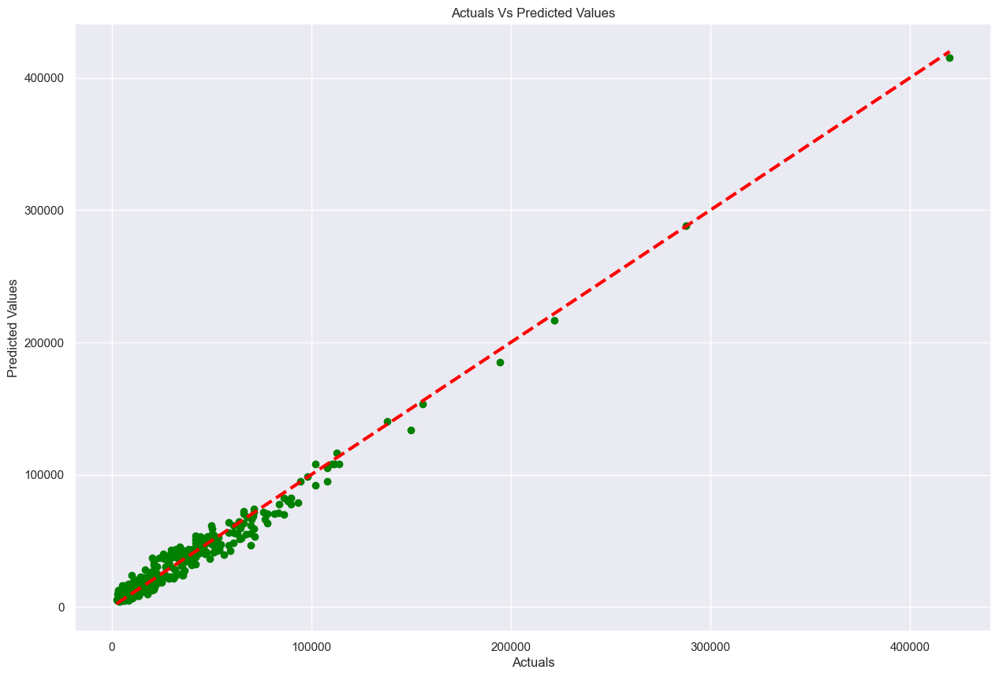

In [58]:

# Graficando Valores Reales vs Predictivos

plt.figure(figsize=(15,10))

plt.scatter(y_train, y_pred, c='green')
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', c='red', lw=3)
plt.xlabel('Actuals')
plt.ylabel('Predicted Values')
plt.title('Actuals Vs Predicted Values')
# Incrementando tamano 

In [59]:
X_train

array([[229, 1, 109.1, ..., False, True, False],
       [290, 3, 100.4, ..., False, False, True],
       [317, 0, 104.3, ..., True, False, True],
       ...,
       [385, 3, 109.1, ..., False, False, True],
       [646, 2, 104.3, ..., False, False, True],
       [457, 2, 109.1, ..., False, False, True]], dtype=object)

In [60]:
# Arreglando el dataframe de entrenamiento
final_df = pd.DataFrame(X_train, columns = X_columns.columns)
final_df['Price'] = y_train.values
final_df['Phase'] = 'Existing data'
final_df['Price Predictions'] = y_pred
print(final_df.shape)
final_df

final_df2 = pd.DataFrame(X_test, columns = X_columns.columns)
final_df2['Price'] = y_test.values
final_df2['Phase'] = 'New unseen data'
final_df2['Price Predictions'] = reg.predict(X_test)
print(final_df2.shape)
final_df2

# Uniendo los conjuntos de datos
final_df3 = pd.concat([final_df, final_df2], ignore_index = True)
print(final_df3.shape)
final_df3.head()

# Uniendo los conjuntos de datos con una unión izquierda, agregando las predicciones al conjunto de datos original.
raw_data['car_ID'] = raw_data['car_ID'].astype(int)
final_df3['car_ID'] = final_df3['car_ID'].astype(int)

(600, 43)
(150, 43)
(750, 43)


# Uniendo el conjunto de datos original con las predicciones.

In [61]:

# arreglando el entrenamiento df
final_df = pd.DataFrame(X_train, columns = X_columns.columns)
final_df['Price'] = y_train.values
final_df['Phase'] = 'Existing data'
final_df['Price Predictions'] = y_pred
print(final_df.shape)

# Corrigiendo el conjunto de pruebas. df
final_df2 = pd.DataFrame(X_test, columns = X_columns.columns)
final_df2['Price'] = y_test.values
final_df2['Phase'] = 'New unseen data'
final_df2['Price Predictions'] = reg.predict(X_test)
print(final_df2.shape)

# uniendolos
final_df3 = pd.concat([final_df, final_df2], ignore_index = True)
print(final_df3.shape)
final_df3.head()


# Realizando una unión izquierda con el conjunto de datos original y las predicciones
raw_data['car_ID'] = raw_data['car_ID'].astype(int)
final_df3['car_ID'] = final_df3['car_ID'].astype(int)

final_df4 = raw_data.merge(final_df3[['car_ID','Phase','Price Predictions']], how = 'left', on = 'car_ID')
final_df4['CarName'] = final_df4['CarName'] + ' - ' + final_df4['car_ID'].astype(str)
print(final_df4.shape)
final_df4.head()

(600, 43)
(150, 43)
(750, 43)
(750, 28)


,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price,Phase,Price Predictions
0,1,3,Honda-Amaze 1.2 VX i-VTEC - 206 - 1,gasolina,turbo,four,sedan,fwd,front,97.3,399.0,168.0,150.5,25284.00,ohc,four,1198,idi,3.62,3.5,9.3,109,4500,28,33,6060.0,Existing data,5942.747280
1,2,3,Maruti Suzuki-Swift DZire VDI - 207 - 2,diesel,std,four,sedan,fwd,front,94.5,399.5,169.5,155.5,26357.25,ohcv,four,1248,mpfi,3.62,3.5,9.3,190,2000,19,24,5400.0,Existing data,5952.119507
2,3,1,Toyota-Glanza G - 208 - 3,gasolina,std,four,hatchback,fwd,front,94.5,399.5,174.5,151.0,26349.50,ohcv,four,1197,mpfi,3.62,3.5,9.3,113,4200,25,25,9588.0,Existing data,7886.420463
3,4,2,Toyota-Innova 2.4 VX 7 STR [2016-2020] - 209 - 4,diesel,turbo,four,Wagon,rwd,front,100.4,473.5,183.0,179.5,32848.50,ohcv,four,2393,mpfi,3.62,3.5,9.3,343,1400,19,24,23400.0,Existing data,21021.244338
4,5,2,Maruti Suzuki-Ciaz ZXi - 210 - 5,gasolina,std,four,sedan,fwd,front,100.4,449.0,173.0,148.5,25690.50,ohcv,four,1373,mpfi,3.62,3.5,9.3,130,4000,28,33,8100.0,Existing data,8707.709981


In [64]:
final_df4.to_excel('CarPrice_Assignment_DS1_Output.xlsx', index=False)
print(os.getcwd())

C:\Users\jimen\Desktop\power bi\Proyecto_Final\expo
